# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

In [2]:
# !pip install imblearn  ## Install imblearn package separately to avoid errors.

In [3]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 xgboost==2.0.3 -q --user
#!pip install --upgrade -q threadpoolctl
#!pip install tabulate

In [4]:
# import libraries for data manipulation
import numpy as np # Fundamental package for scientific computing in Python.
import pandas as pd # Open source library providing easy to use  and high-performance data structures and data analysis tools.
import plotly.express as px
# import libraries for data visualization
import matplotlib.pyplot as plt # Used for creating interactive visualizations.
import seaborn as sns  # Data visualization library based on matplotlib to provide a high-level interface for drawing informative graphics.
import warnings # Warnings library
warnings.filterwarnings('ignore')

sns.set_theme()
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)
# Supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
# to compute distances
from scipy.spatial.distance import cdist
from sklearn import metrics

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


# import libraries for model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Import sklearn libraries for missing value imputation
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

# import libraries for split data & metric scores
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)

# Printing style
from tabulate import tabulate

# import libraries for data scaling and one hot encoding
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler

# import libraries for the model tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


# This will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

## Loading the dataset

In [5]:
#For using with Google Colab use by uncommenting below codes

#from google.colab import drive
#drive.mount('/content/drive')

# read the data
    #df = pd.read_csv('/content/drive/My Drive/Python Course/BankChurners.csv')
# returns the first 5 rows
    #df.head()

In [6]:
# read the data
data = pd.read_csv("BankChurners.csv")
# returns the first 5 rows
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [7]:
# Keep the main dataframe intact as the source backup and make a copy of the same to work on

df = data.copy()

## Data Overview

In [8]:
df.shape

(10127, 21)

In [9]:
# let's view the first 5 rows of the data
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [10]:
# let's view the last 5 rows of the data
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


In [11]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

#### Observations
* There are a total of 21 columns and 10,127 observations in the dataset
* We can see that 2 columns have less than 10,127 non-null values i.e. columns have missing values.

In [12]:
# List the names of columns in given dataframe
print (df.columns.tolist()) 

['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


In [13]:
df.duplicated().sum()

0

##### Let's check the number of unique values and null values in each column

In [14]:
# Checking the missing values using isnull() function.
df.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [15]:
# Checking the unique values using nunique() function.
df.nunique() 

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [16]:
# Checking for the null value in the dataset
df.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

* We observe 1519 missing values for Education_Level and 749 missing values for Marital_Status out of total 10127.
* No duplicate data is found in the given Data set.

In [17]:
# let's view the statistical summary of the numerical columns in the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


##### Checking the value count for each category of categorical variables

In [18]:
# Making a list of all catrgorical variables
cat_col = ["Attrition_Flag", "Gender","Education_Level", "Marital_Status", "Income_Category", "Card_Category"]

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("-" * 40)

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
----------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
----------------------------------------
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
----------------------------------------
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
----------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
----------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
----------------------------------------


## Data Overview

#### Observations
* We observed 10127 rows and 21 columns in the given dataset
* Categorical variables are Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category and Card_Category. 
  All other are numeric variables.
* Customer_Age ranges with a minimum age of 26 and maximum age of 73 and average age of customer is 46.
* Dependent_Count, minimum is 0 and Maximum is 5. Mean dependent count is 2.
* Attrition_Flag is the given target variable
* There are 8500 Existing Customers and 1627  Attrited Customers.
* Out of 8500 customers 5358 are Female and 4769 are Male.
* The customer Education Levels are Graduate -  3128, High School -  2013, Uneducated - 1487, College - 1013, 
  Post-Graduate -  516, Doctorate -  451
* Out of 8500 customers 4687 are Married , 3943 are Single, and 748 are Divorced.
* Observed 6 income categories in the data, 3561 customers earn in USD less than 40K, 1790 of them earn between 40K and 60K,
  1402 of them earn between 60K and 80K , 1535 earn between  80K - 120K ,727 of them earn  120K+  
* Months_on_book has a Min value is 13 months and Max 56, with a mean and median of 36 months. That shows that the given data 
  is having the customer related data of atleast 13 months.
* Total_Relationship Count has min 1 and max 6 with and average of ~4.
* We observe 4 type of Card_Category in the data namely Blue, Silver, Gold and Platinum.


#### Sanity Checks
* No negativevalues in the given data.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [19]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [20]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=45, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            #label = "{:.1f}%".format(100 * p.get_height() / total)  # percentage of each class of the category            
            label = '{:.1f}%\n({})'.format(100 * p.get_height()/len(data[feature]), p.get_height())  # percentage with value of each class of the category       
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=10,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [21]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [22]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

### Univariate Analisys
#### We shall analyse the numeric columns independantly using the above defined functions

##### Analyze by  'Customer_Age'

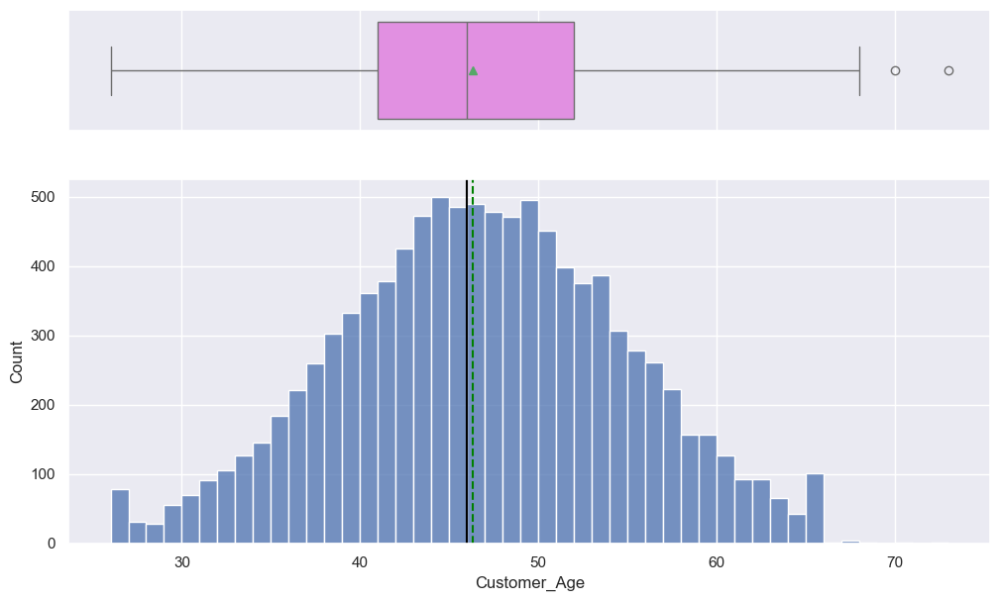

In [23]:
histogram_boxplot(df, "Customer_Age")

* The age in the data is uniformly distributed between age of 26 to 73.
* We observe two outliers in the boxplot at the extreme right in the higher age.

##### Analyze by  'Dependent_count'

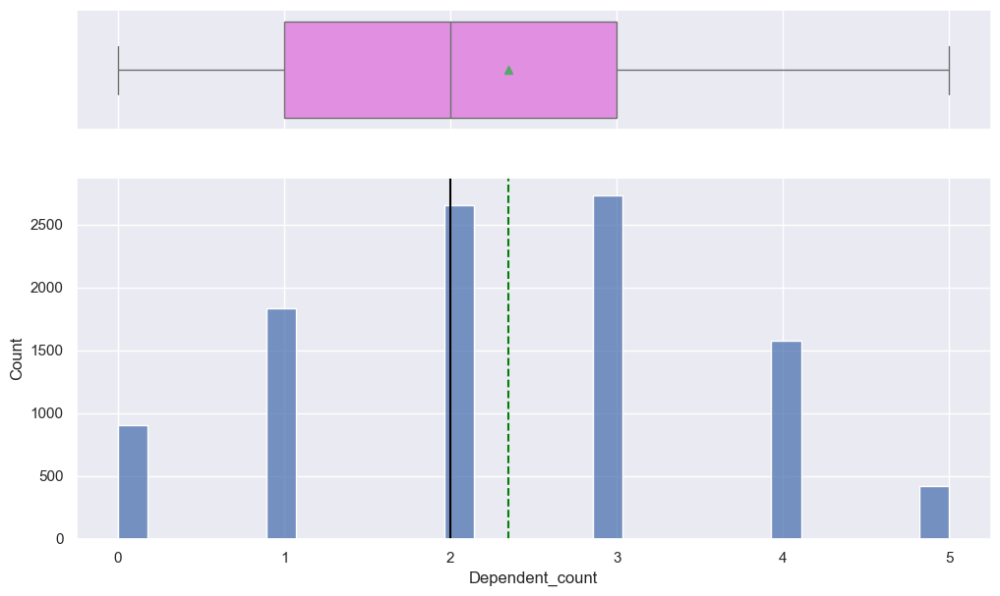

In [24]:
histogram_boxplot(df, "Dependent_count")

In [25]:
dependent_size_counts = df['Dependent_count'].value_counts()
# Ploting a pie chart to show the dependent strenth-wise distribution
fig = px.pie(dependent_size_counts, values='Dependent_count', names=dependent_size_counts.index, title='Distribution of dependent Size',hole=.3,color_discrete_sequence=px.colors.sequential.RdBu,hover_data=['Dependent_count'], labels={'index':'Dependent Size','Dependent_count':'Count'})
fig.show()

* Dependent count distribution is observed normal ranging between 0 to 5 and no outliers found.

##### Analyze by  'Months_on_book'

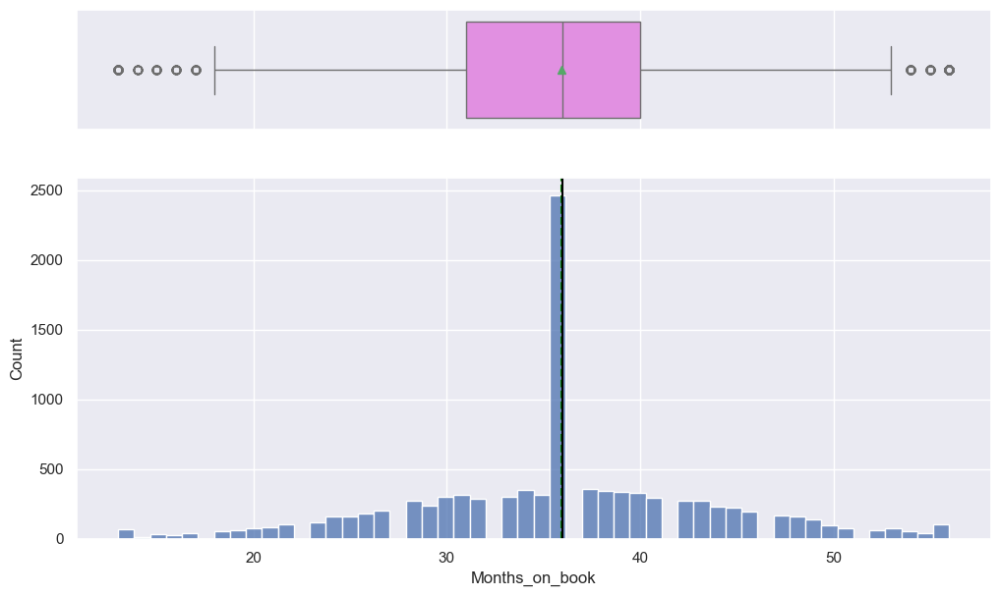

In [26]:
histogram_boxplot(df, "Months_on_book")

* The months on book distribution is not uniform that we can observe a hike near the median at around 35.
* We can observe outliers at the both ends of the boxplot.
* We are not treating the outliers being the count is not too high.

##### Analyze by  'Total_Relationship_Count'

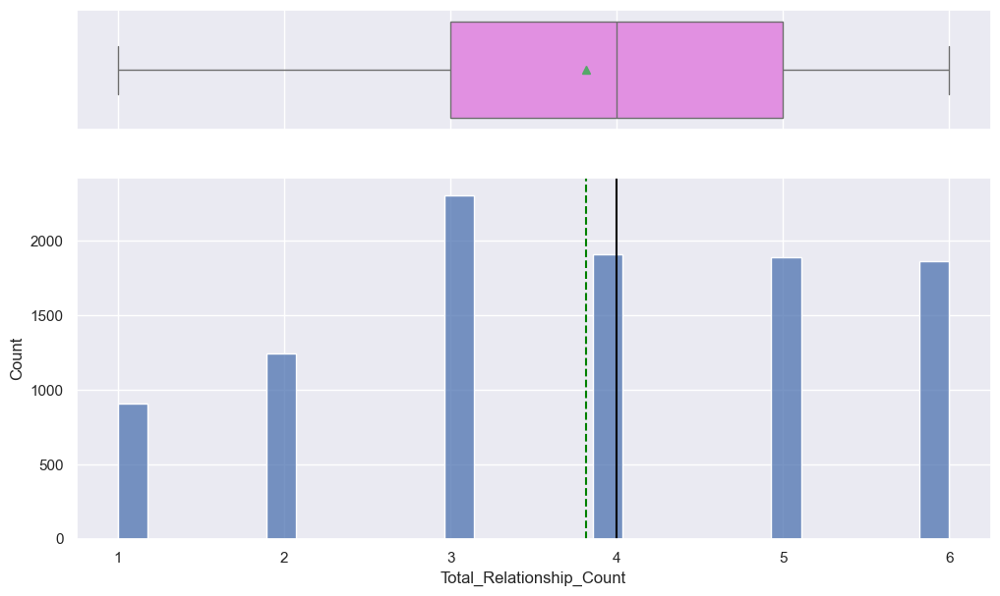

In [27]:
histogram_boxplot(df, "Total_Relationship_Count")

In [28]:
size_counts = df['Total_Relationship_Count'].value_counts()
# Ploting a pie chart to show the relationship ( Products used) strenth-wise distribution
fig = px.pie(size_counts, values='Total_Relationship_Count', names=size_counts.index, title='Distribution of Relationship count',hole=.3,color_discrete_sequence=px.colors.sequential.YlOrRd,hover_data=['Total_Relationship_Count'], labels={'index':'Products held','Total_Relationship_Count':'Count'})
fig.show()

* The total relationship count is not uniformly distributed.
* Most of the customers are having  4 or more products or relations with the bank.
* No outliers observed in the boxplot.

##### Analyze by  'Months_Inactive_12_mon'

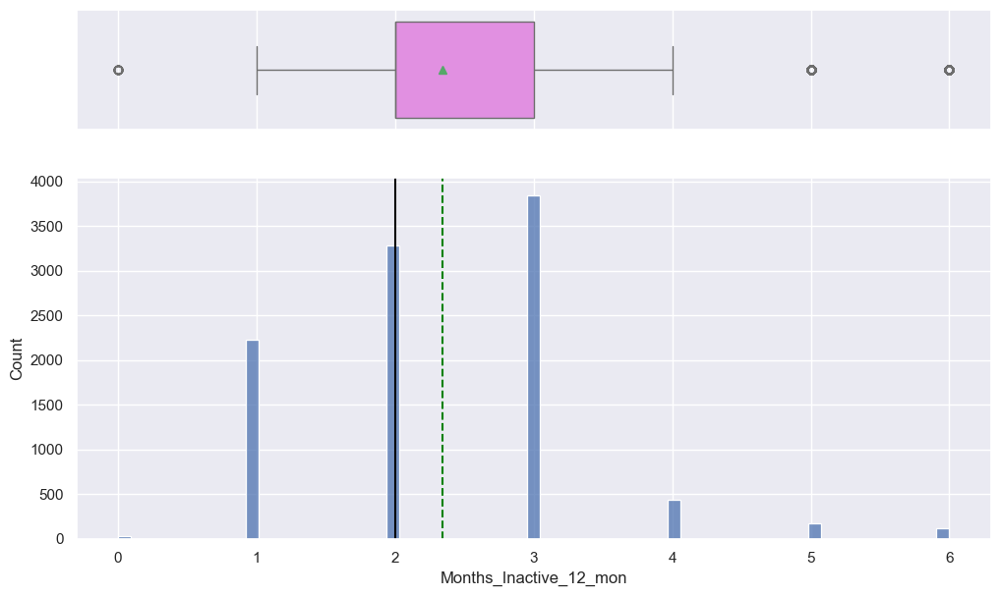

In [29]:
histogram_boxplot(df, "Months_Inactive_12_mon")

In [30]:
size_counts = df['Months_Inactive_12_mon'].value_counts()
# Ploting a pie chart to show the Months inactive less than 12 months strenth-wise distribution
fig = px.pie(size_counts, values='Months_Inactive_12_mon', names=size_counts.index, title='Distribution of Months inactive less than 12 months',hole=.3,color_discrete_sequence=px.colors.sequential.YlGnBu,hover_data=['Months_Inactive_12_mon'], labels={'index':'Months Inactive','Months_Inactive_12_mon':'Count'})
fig.show()

* The months inactive 12 months is not uniformly distributed.
* We can observe outliers at the both ends of the boxplot.
* We are not treating the outliers being the count is not too high.

##### Analyze by  'Contacts_Count_12_mon'

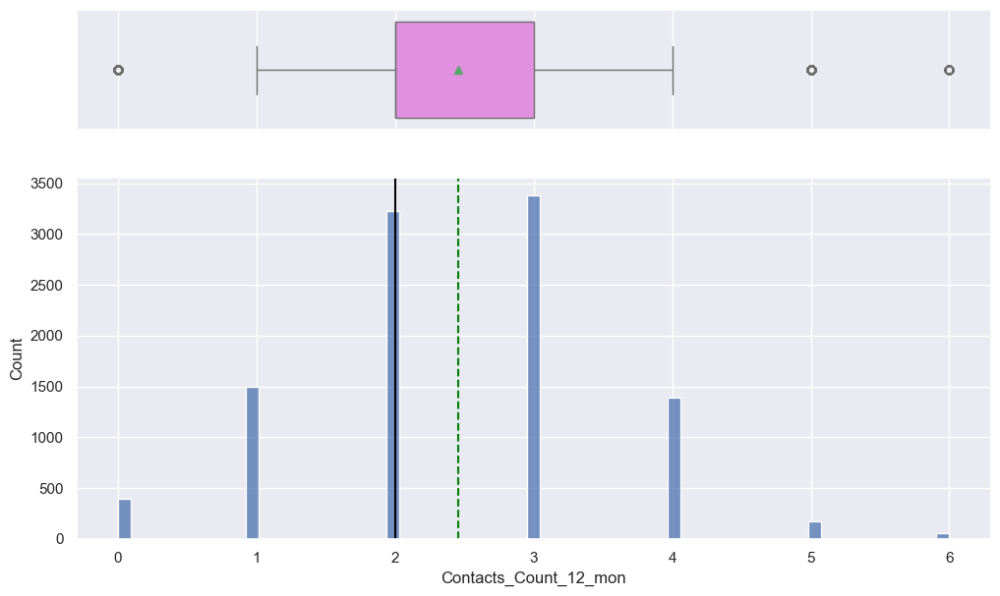

In [31]:
histogram_boxplot(df, "Contacts_Count_12_mon")

In [32]:
size_counts = df['Contacts_Count_12_mon'].value_counts()
# Ploting a pie chart to show the contacts count strenth-wise distribution
fig = px.pie(size_counts, values='Contacts_Count_12_mon', names=size_counts.index, title='Distribution of Contacts count',hole=.3,color_discrete_sequence=px.colors.sequential.RdBu,hover_data=['Contacts_Count_12_mon'], labels={'index':'No. of contacts in 12 months','Contacts_Count_12_mon':'Count'})
fig.show()

* The contacts between bank and customers in last 12 months is uniformly distributed.
* We can observe outliers at the both ends of the boxplot.
* Outliers at 0 ( means no or low number of contacts) seems to be checked.
* We are not treating the outliers being the count is not too high.

##### Analyze by  'Credit_Limit'

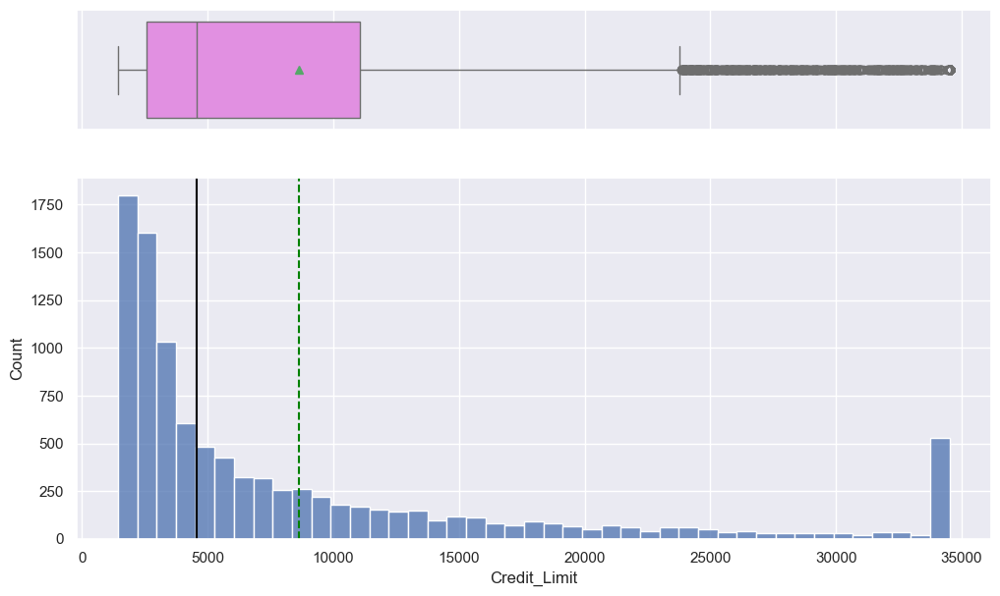

In [33]:
histogram_boxplot(df, "Credit_Limit")

* The credit limit distribution of is right-skewed
* We can observe noticeable count of outliers at the right ends of the boxplot.
* We will have to treat these outliers as their count seems to be high, may be more customers with high credit limits.

##### Analyze by  'Total_Revolving_Bal'

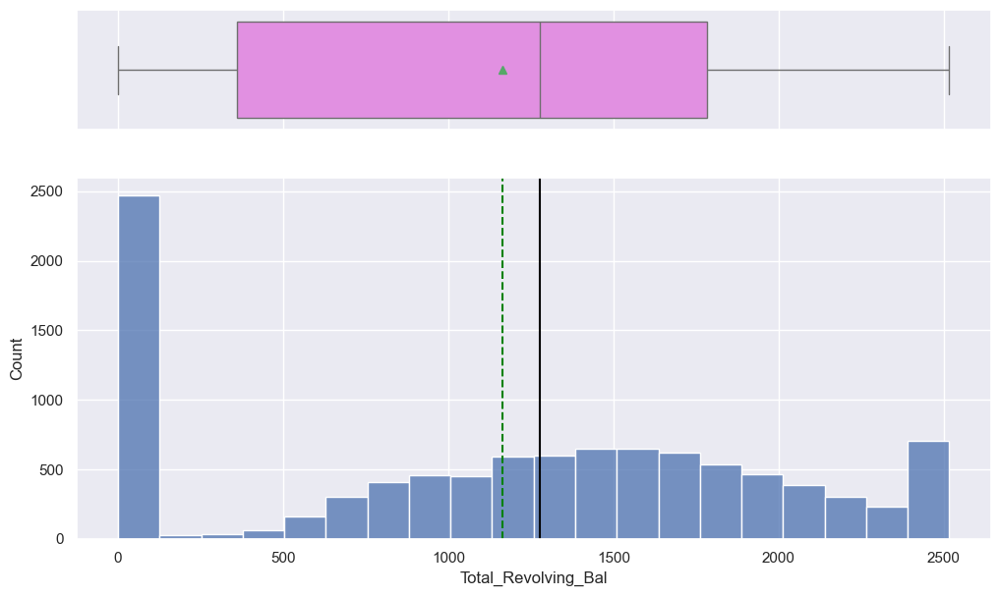

In [34]:
histogram_boxplot(df, "Total_Revolving_Bal")

* The total revolving balance distribution is not uniform.
* No outliers observed in the boxplot.

##### Analyze by  'Avg_Open_To_Buy'

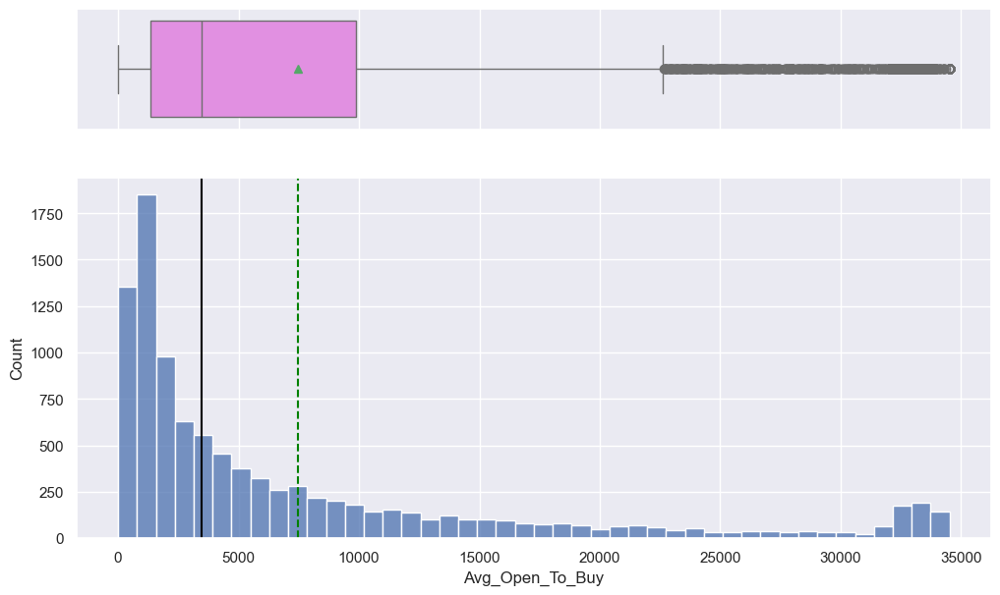

In [35]:
histogram_boxplot(df, "Avg_Open_To_Buy")

* The avg open to buy distribution is right-skewed.
* We can observe noticeable count of outliers at the right ends of the boxplot.
* We may have to treat these outliers as their count seems to be high, may be there are more customers use only minimal 
  or limited credit limit and their limit is open to buy more.
* This may also be due to outlier customers with more credit limits are using only a minimal credit for thier buy.

##### Analyze by  'Total_Amt_Chng_Q4_Q1'

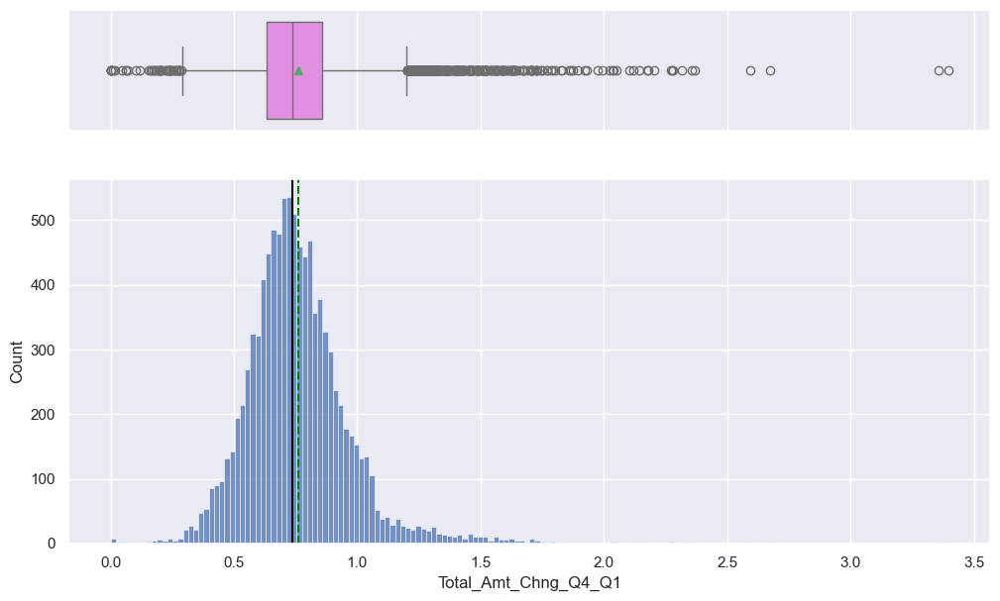

In [36]:
histogram_boxplot(df, "Total_Amt_Chng_Q4_Q1")

* The Change in Transaction Amount (Q4 over Q1) distribution is uniform on both sides.
* We can observe noticeable count of outliers at both the ends of the boxplot with more outliers on the right end.
* We may have to treat these outliers if required as their count seems to be high.

##### Analyze by  'Total_Trans_Amt'   
##### Total transaction amount distribution.

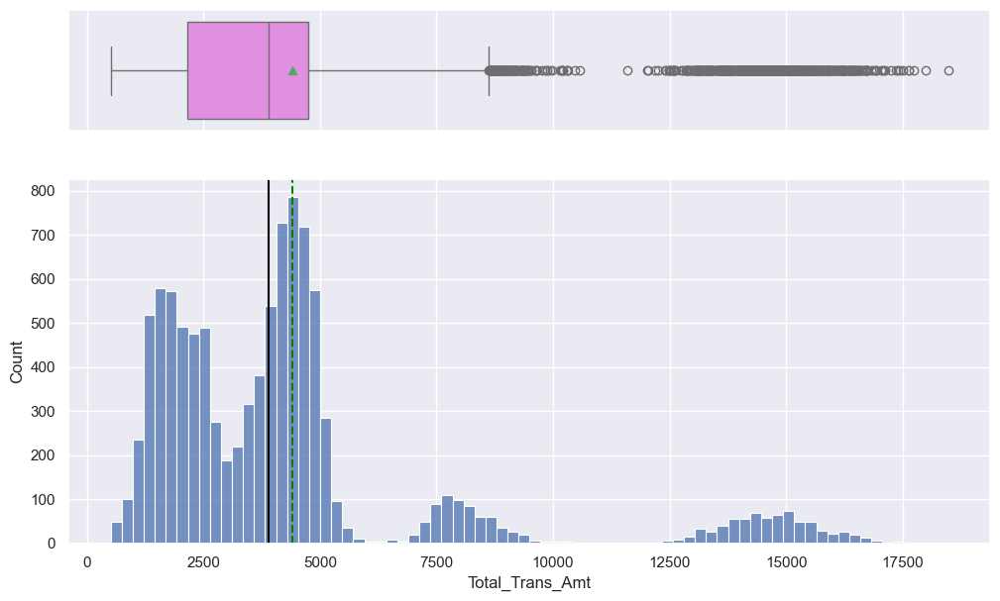

In [37]:
histogram_boxplot(df, "Total_Trans_Amt")

* The total trans amount is not uniformly distributed.
* We can observe too much of outliers at the right ends of the boxplot.
* We may have to treat these outliers if required as their count seems to be high.

##### Analyze by  'Total_Trans_Ct'

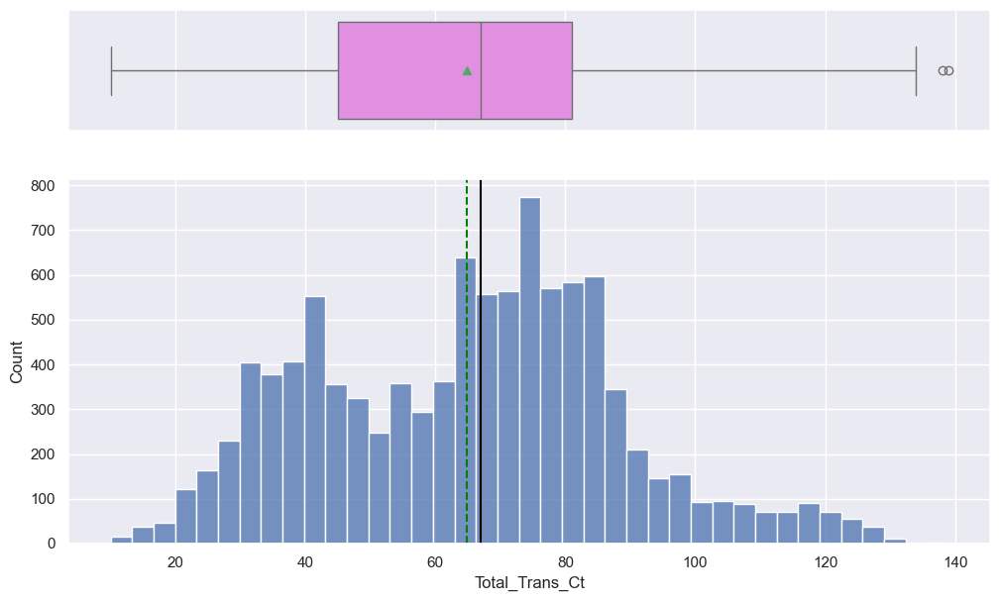

In [38]:
histogram_boxplot(df, "Total_Trans_Ct")

* The total trans count is not uniformly distributed.
* We can observe few outliers at the right ends of the boxplot.
* We need not treat these outliers being the count is minimal and may be the data is useful.

##### Analyze by  'Total_Ct_Chng_Q4_Q1'

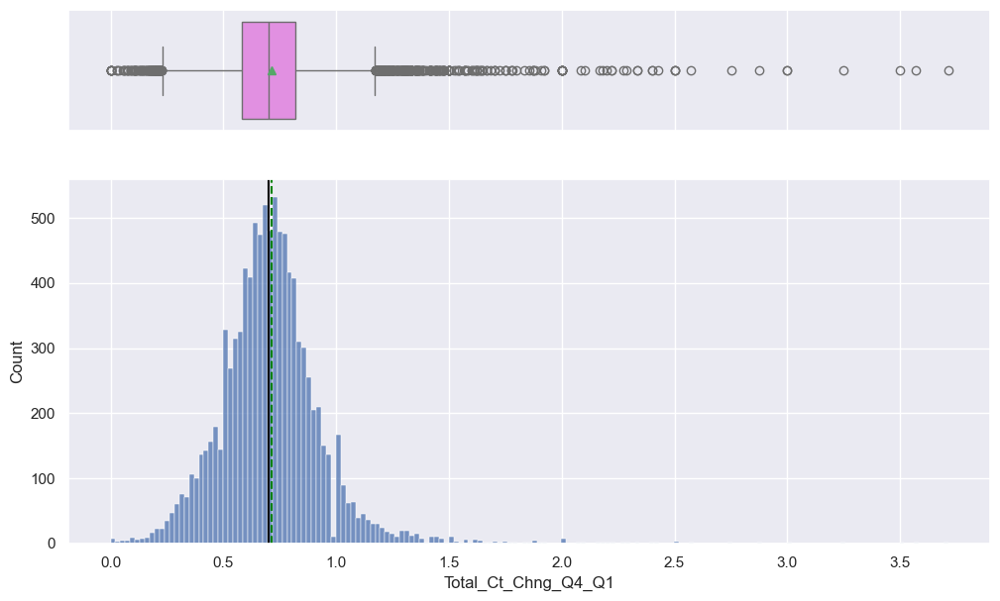

In [39]:
histogram_boxplot(df, "Total_Ct_Chng_Q4_Q1")

* The Change in Transaction Count (Q4 over Q1) distribution is uniform.
* We can observe noticeable count of outliers at both the ends of the boxplot with more outliers on the right end.
* We may have to treat these outliers if required as their count seems to be high.

##### Analyze by  'Avg_Utilization_Ratio'

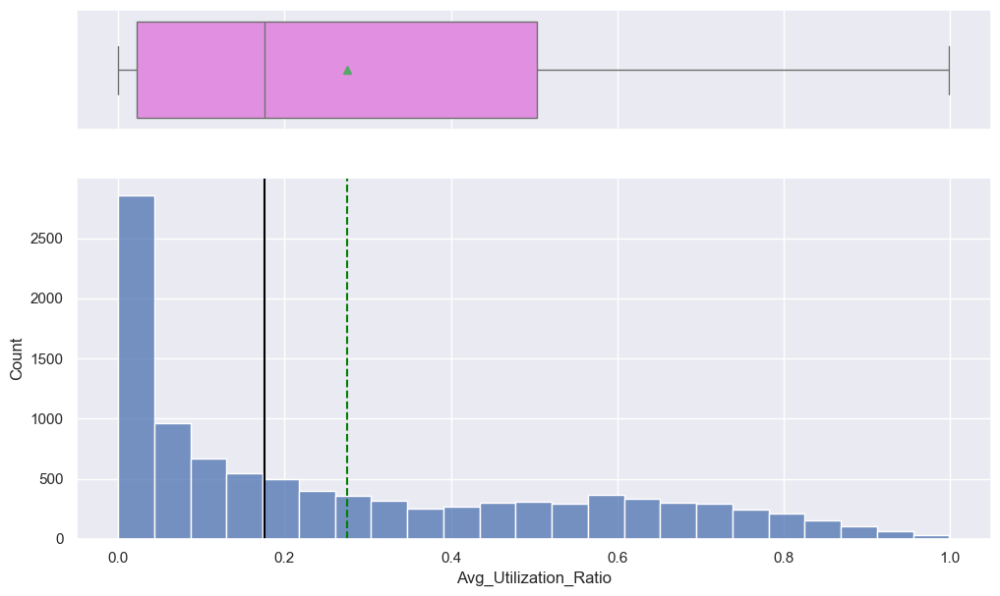

In [40]:
histogram_boxplot(df, "Avg_Utilization_Ratio")

* The average utilization ratio is right-skewed.
* No outliers observed in the boxplot.

### We shall analyse the non-numeric columns independantly using the above defined functions

##### Analyze by  'Attrition_Flag'

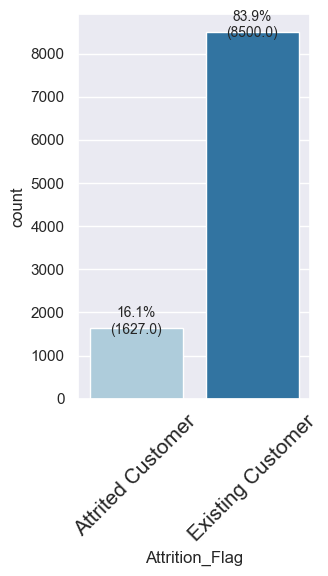

In [41]:
labeled_barplot(df,"Attrition_Flag", perc=True)

* We observe the imbalance in class distribution of the target variable.
* Out of 10127 customers 1627 ( 16.1%) are attrited customers and 8500 (84.9%) observations are for existing customers. 
  That shows an imbalance of 84:16 is observed.

##### Analyze by  'Gender'

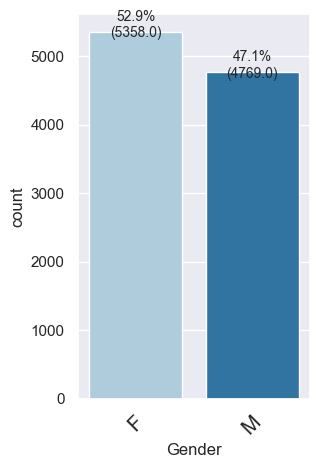

In [42]:
labeled_barplot(df, "Gender", perc=True)

* Males (4769) and Females(5358) are almost equaly distributed in a ratio 47:53 .

##### Analyze by  'Education_Level'
##### The distribution of the level of education of customers

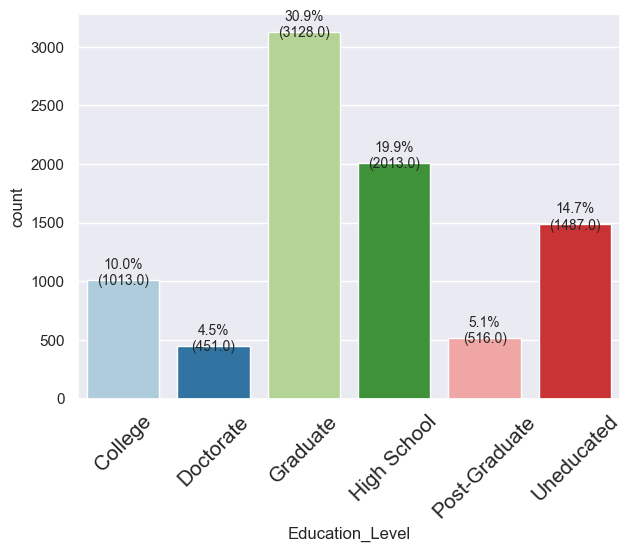

In [43]:
labeled_barplot(df, "Education_Level", perc=True)
size_counts = df['Education_Level'].value_counts()
# Ploting a pie chart to show the relationship ( Education Level) strenth-wise distribution
fig = px.pie(size_counts, values='Education_Level', names=size_counts.index, title='Distribution of Education Level',hole=.3,color_discrete_sequence=px.colors.sequential.YlOrRd,hover_data=['Education_Level'], labels={'index':'Education Level','Education_Level':'Count'})
fig.show()

* More number of customers are graduates or postgraduates.
* Post-graduate and doctorates customers are less in number.
* Uneducated (1487), High School (2013) and College (1013) totalling to 4513 which is 44.56%.

##### Analyze by  'Marital_Status'

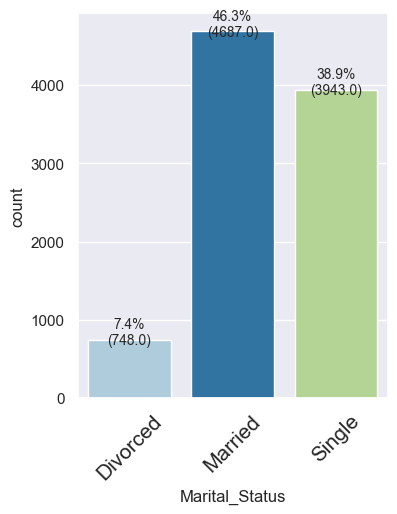

In [44]:
labeled_barplot(df, "Marital_Status",perc=True)

* Majority of the customers are Married. Marital status class for single and married are not showing a much difference.
* Out of 10127 customers only 748 are divorced, that is 7.4% are divorced status customers.

##### Analyze by  'Income_Category'
##### The distribution of the level of income of customers

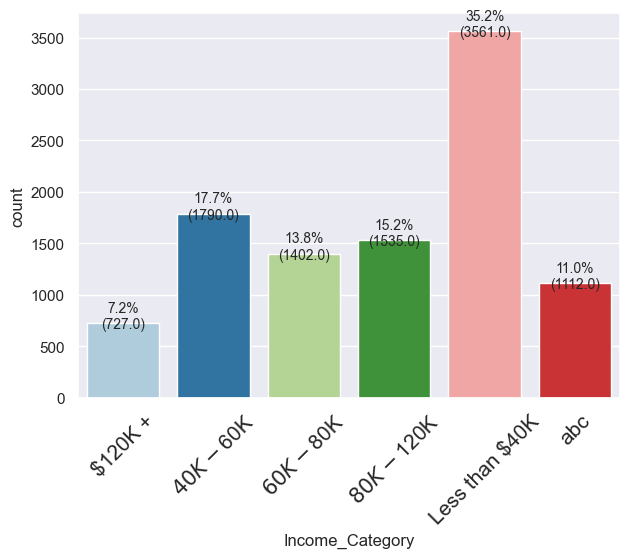

In [45]:
labeled_barplot(df, "Income_Category", perc=True)
size_counts = df['Income_Category'].value_counts()
# Ploting a pie chart to show the relationship ( Income Category) strenth-wise distribution
fig = px.pie(size_counts, values='Income_Category', names=size_counts.index, title='Distribution of Income Category',hole=.3,color_discrete_sequence=px.colors.sequential.RdBu,hover_data=['Income_Category'], labels={'index':'Income Category','Income_Category':'Count'})
fig.show()

* More customers (3561) are in Less than 40k income group.

##### Analyze by  'Card_Category'

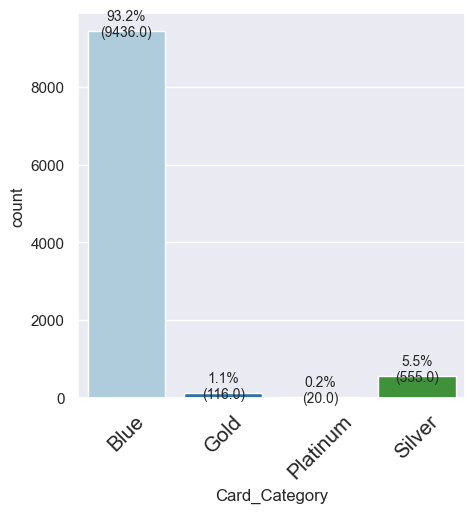

In [46]:
labeled_barplot(df, "Card_Category", perc=True)

* Majority of the customers (9436) that is 93.2% customers are users of Blue category card.

### Bivariate Analysis
#### Checking Correlations

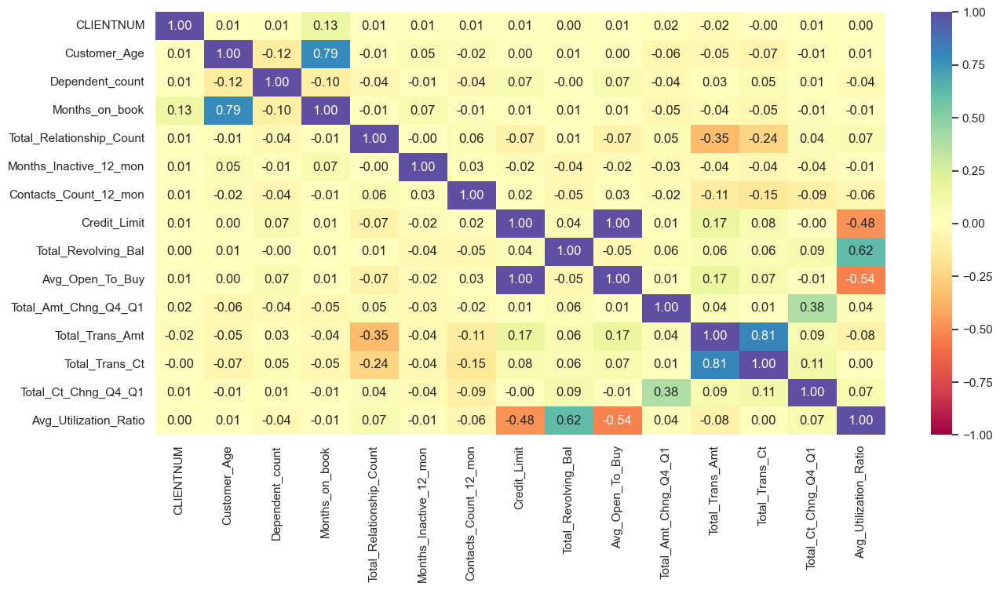

In [47]:
# selecting numerical columns
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

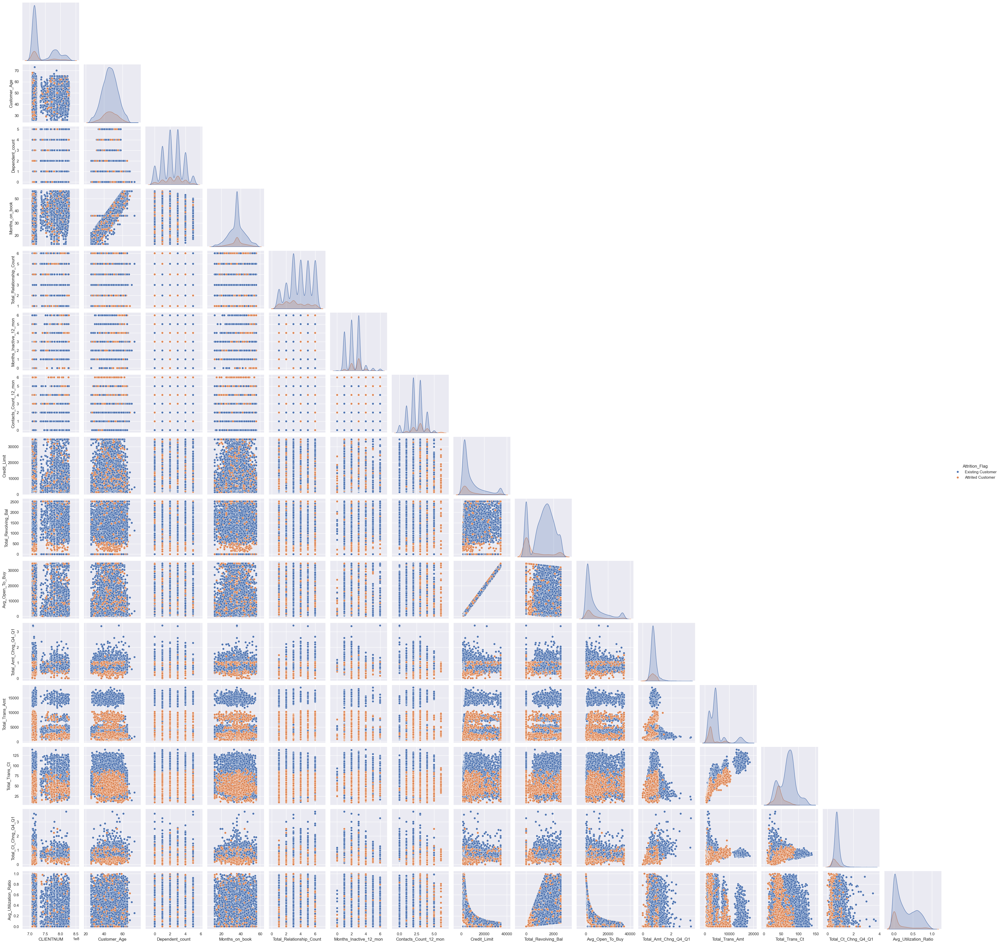

In [48]:
sns.pairplot(df, hue="Attrition_Flag", corner=True)

* A strong positive correlation is observed between the age of the customer and the months on books. This shows the 
  strong relationship between customer age and Bank (in months).
* A negative correlation is observed between the credit limit and average utilization ratio, while the credit limit increases,
  the average utilization ratio is decreasing.
* A positive correlation between the total revolving balance and average utilization, showing that the customers with higher
  average utilization will have higher total revolving balances.
* The average opening balance shows a negative correlation with the average utilization ratio, suggesting that higher average
  opening balances are associated with lower average utilization ratios
* There exists minimal correlation between the total transfer amount and the credit limit, indicating that the credit limit 
  has little influence on the total transfer amount.
* We observe a strong correlation between the total transfer amount and the total transfer count, suggesting that customers 
  with a greater number of transfer transactions tend to accumulate higher total transfer amounts.
* The average open-to-buy and the Credit Limit exhibit full correlation (1.00) , indicating a strong relationship between 
  these two variables. We should consider eliminating one to prevent redundancy.
* We know the total transaction amount change (Q4-Q1) correlates with both the total amount change and the total count change,
  as the change in transactions may be accounted to the total transaction amount. We may remove one of these columns to 
  avoid data duplication.
* Attrition Flag is not showing any strong correlation with the numeric variables.

<Axes: xlabel='Attrition_Flag', ylabel='Customer_Age'>

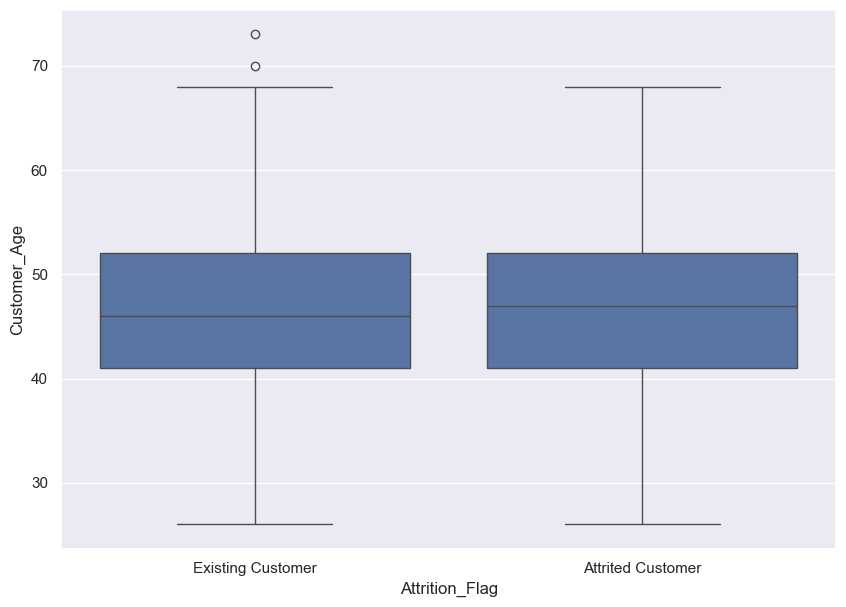

In [49]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=df, orient="vertical")

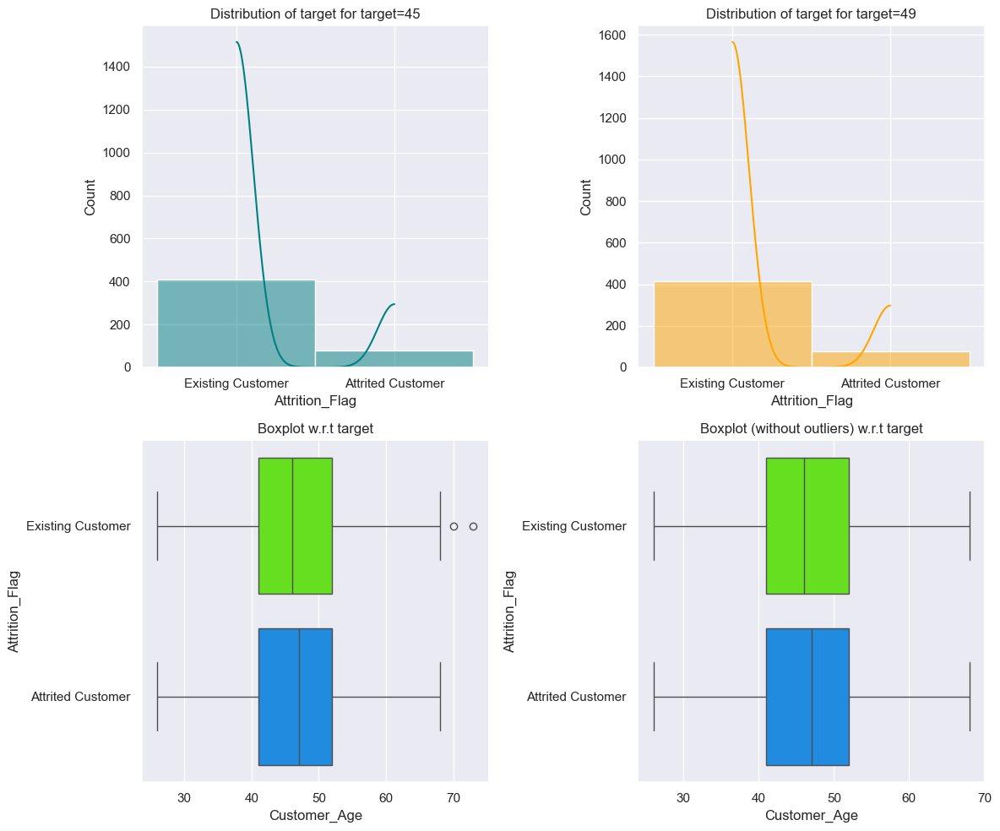

In [50]:
distribution_plot_wrt_target(df, "Attrition_Flag", "Customer_Age")

* We observe outliers in boxplots of attrited customer class distributions.
* Attrition not showing much to change with customer age.

<Axes: xlabel='Attrition_Flag', ylabel='Dependent_count'>

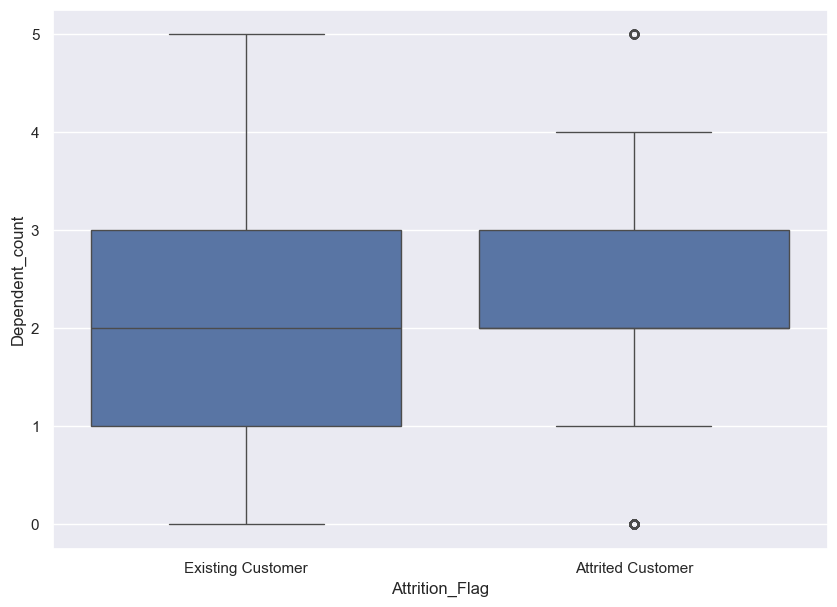

In [51]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Dependent_count", data=df, orient="vertical")

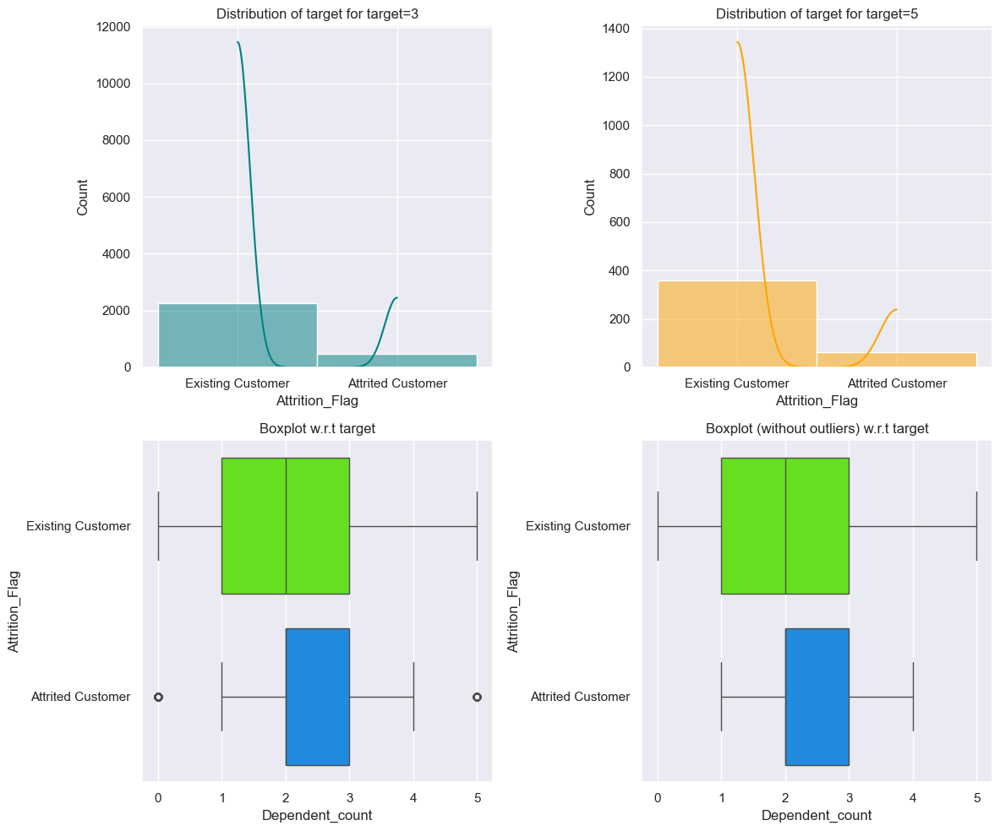

In [52]:
distribution_plot_wrt_target(df, "Attrition_Flag", "Dependent_count")

* We observe outliers in the boxplot at the extreme right and left in the attrited customers.
* We observe that attrition is significantly concentrated among customers with 2 to 3 dependants. This shows that customers 
  with 2-3 dependants are more likely to experience attrition.

<Axes: xlabel='Attrition_Flag', ylabel='Months_Inactive_12_mon'>

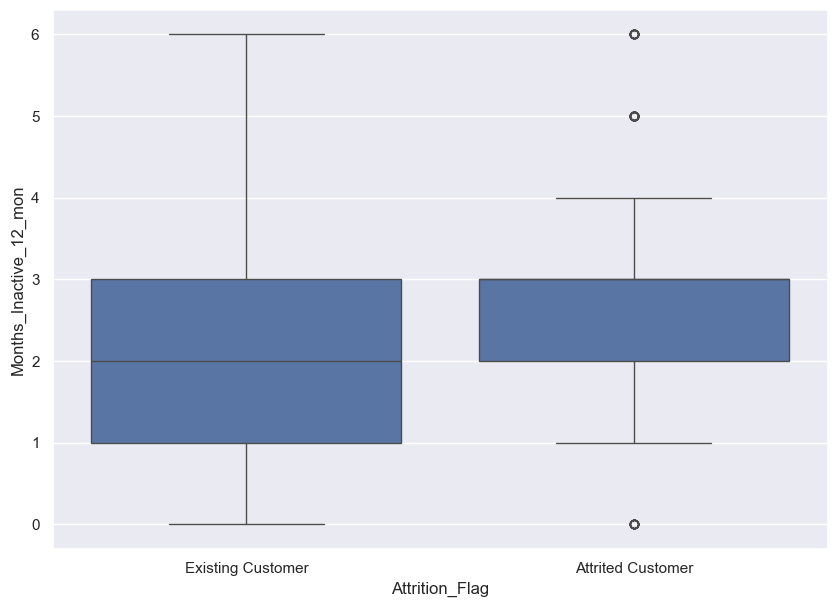

In [53]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Months_Inactive_12_mon", data=df, orient="vertical")

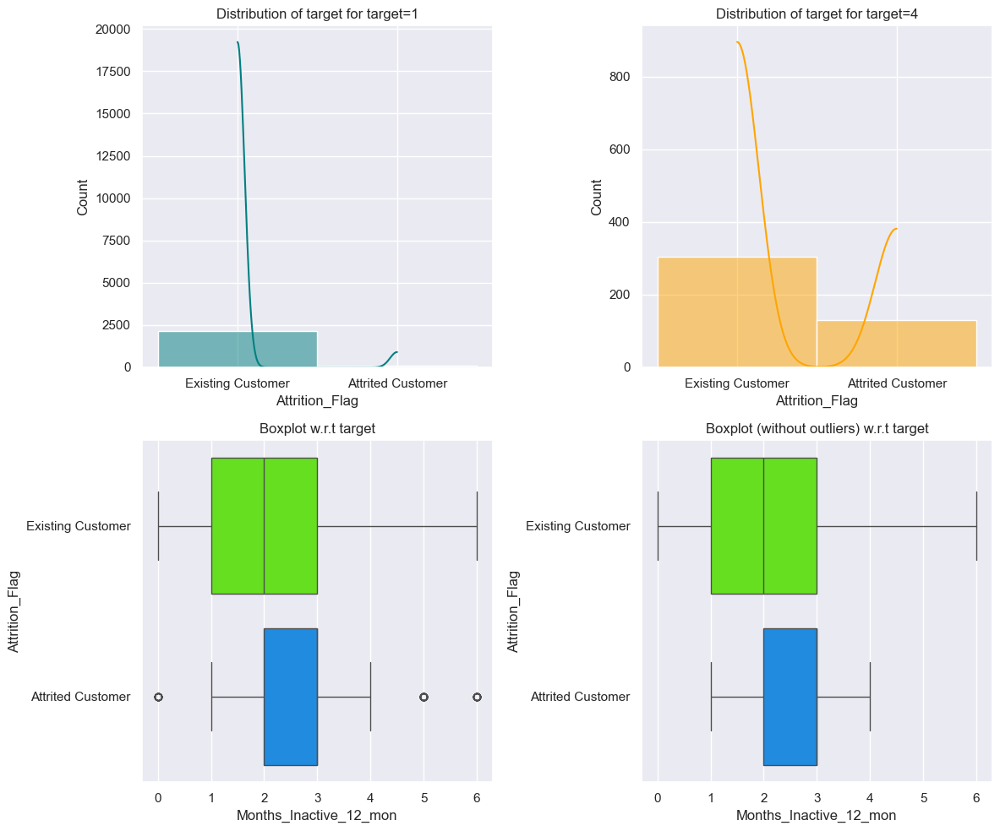

In [54]:
distribution_plot_wrt_target(df, "Attrition_Flag", "Months_Inactive_12_mon")

*  We observe outliers in the boxplot at both the ends of the attrited customers.
*  We observe that the number of months inactive in the last 12 months is higher among attrited customers compared to 
   existing customers.This indicates that attrited customers are likely to have more inactive months compared to active 
   customers.

<Axes: xlabel='Attrition_Flag', ylabel='Contacts_Count_12_mon'>

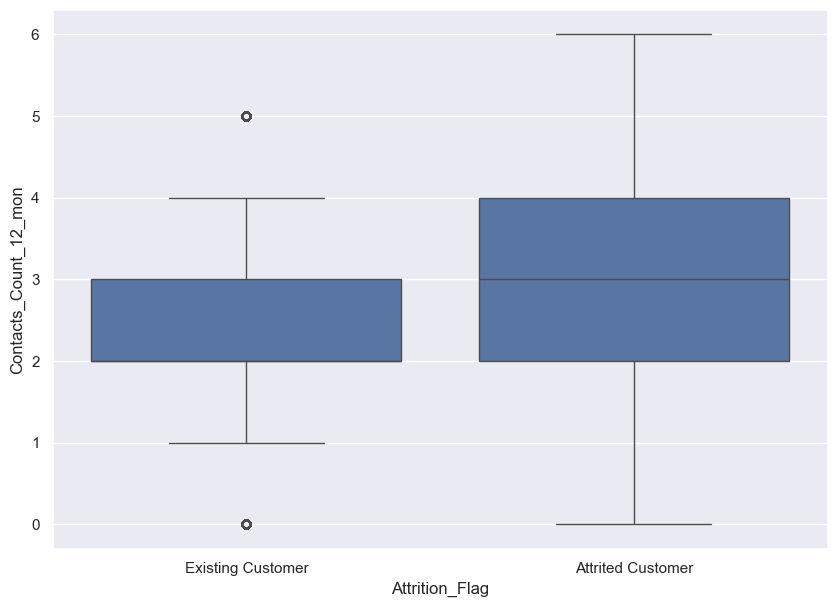

In [55]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Contacts_Count_12_mon", data=df, orient="vertical")

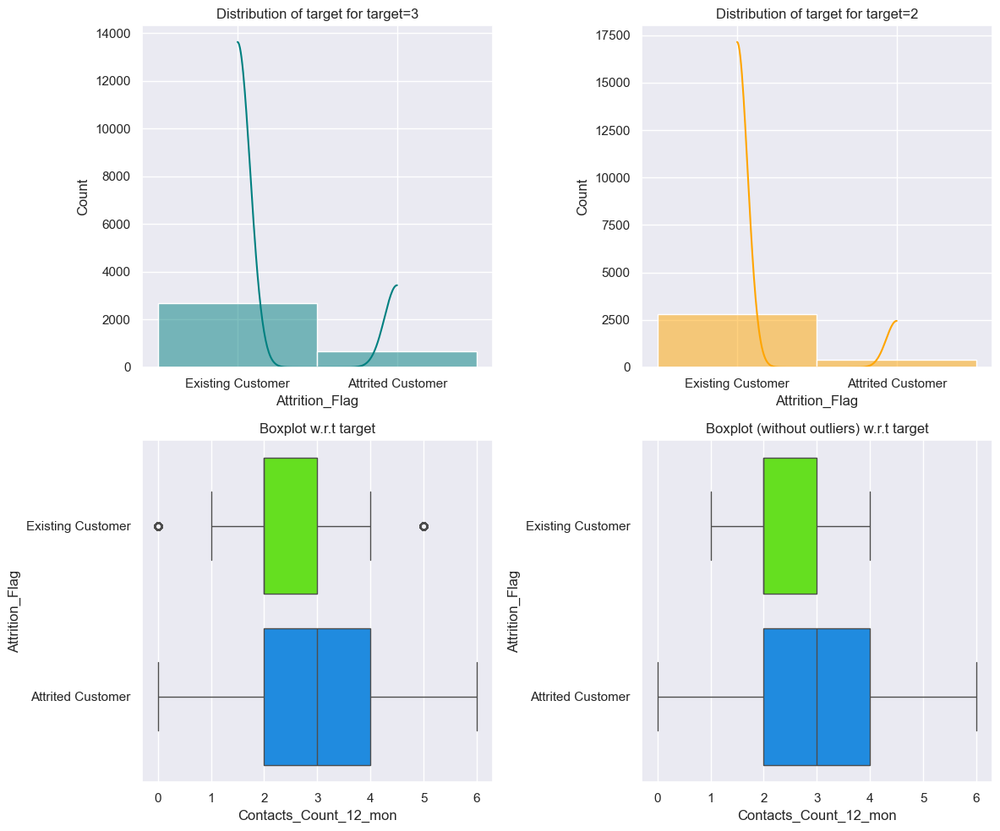

In [56]:
distribution_plot_wrt_target(df, "Attrition_Flag", "Contacts_Count_12_mon")

* We observe outliers in the boxplot at both the ends of the existing customers.
* We observe that attrited customers tend to have a higher number of contacts in the last 12 months compared to existing
  customers.This suggests that attrited customers are likely to have had more contacts compared to existing customers.

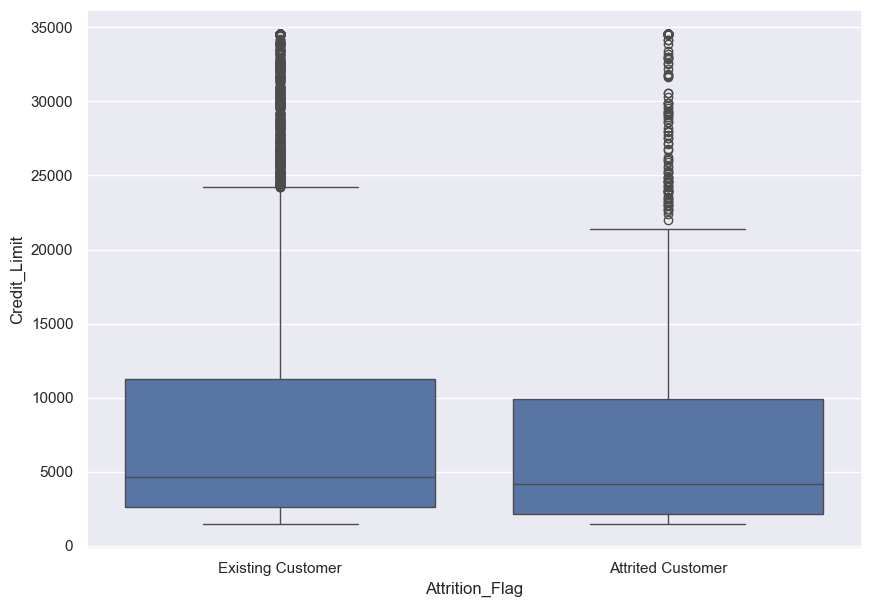

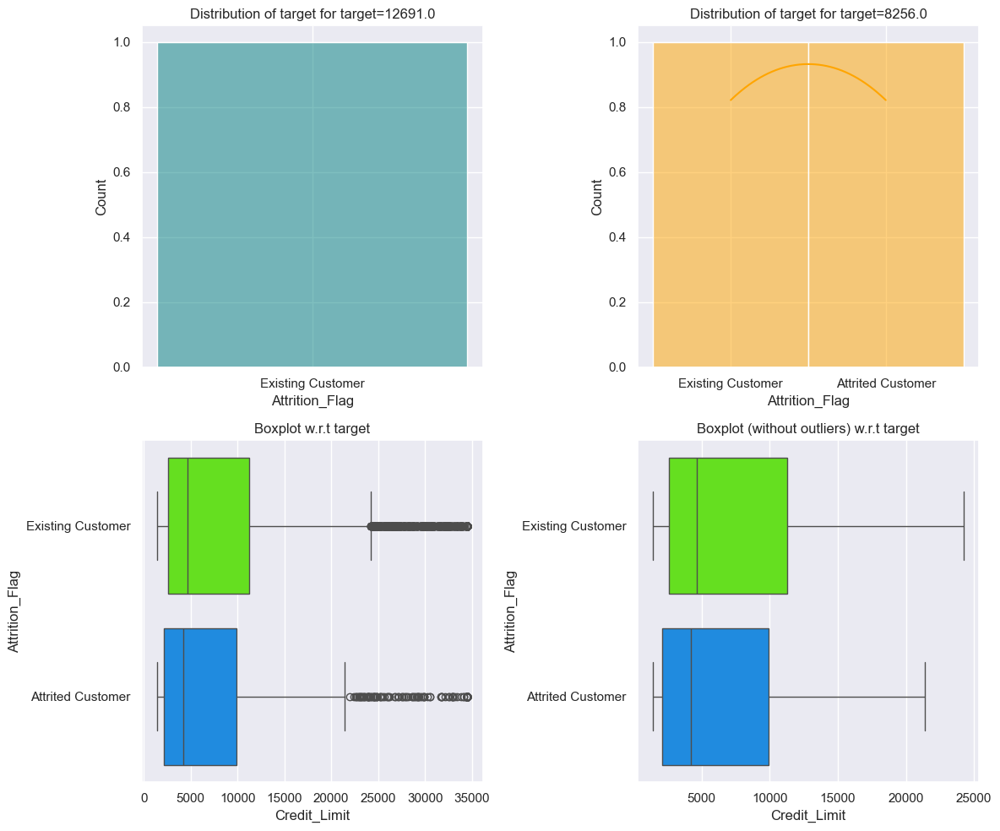

In [57]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Credit_Limit", data=df, orient="vertical")
distribution_plot_wrt_target(df, "Attrition_Flag", "Credit_Limit")

* We observe outliers in the boxplot for both existing customers and attritted customers.
* We observe that attrited customers typically have a slightly lower credit limit than existing customers, based on the median.
  This shows customers having lower credit limit are likely to get attritted.

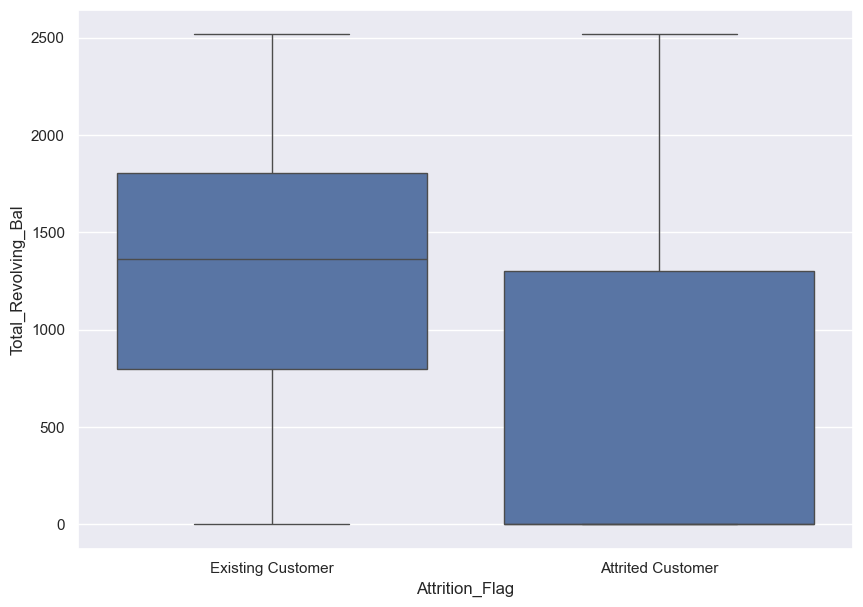

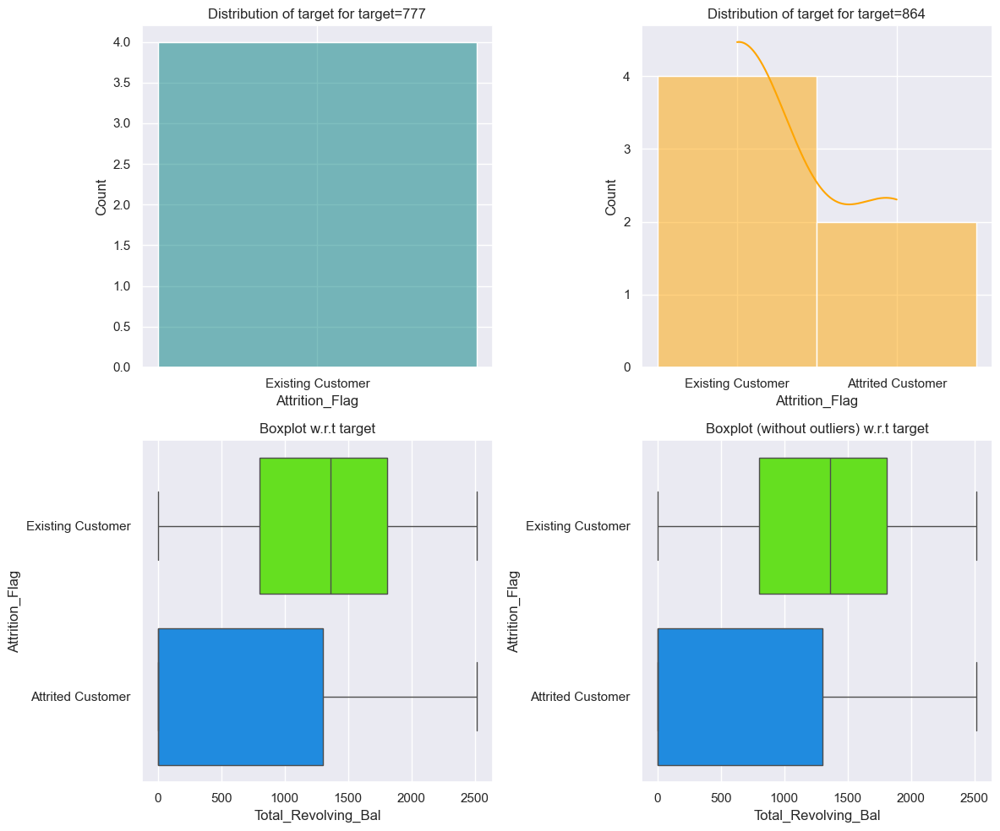

In [58]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Revolving_Bal", data=df, orient="vertical")
distribution_plot_wrt_target(df, "Attrition_Flag", "Total_Revolving_Bal")

* We observe that attrited customers generally have a significantly lower total revolving balance compared to existing
  customers, based on the median. This suggests that customers with a lower total revolving balance are more likely to have
  chance of attrition.

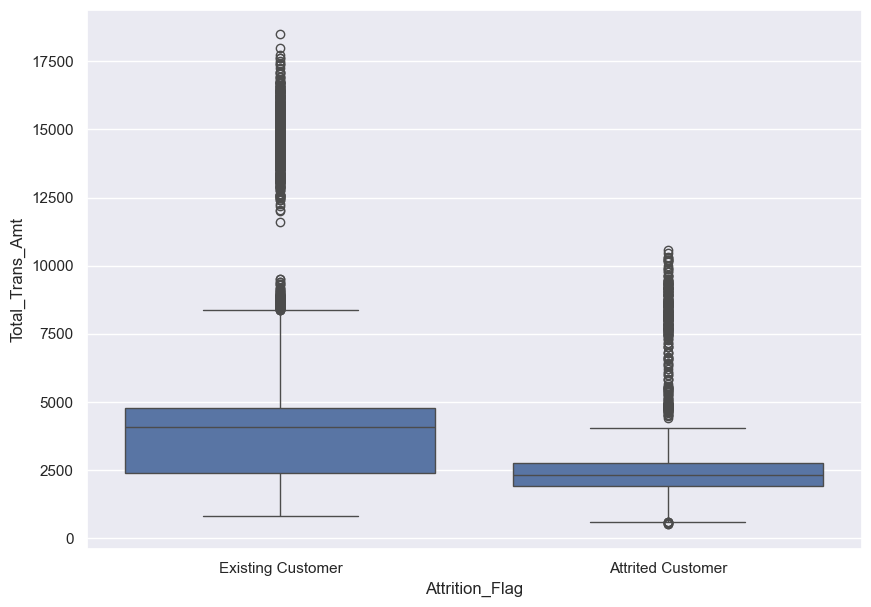

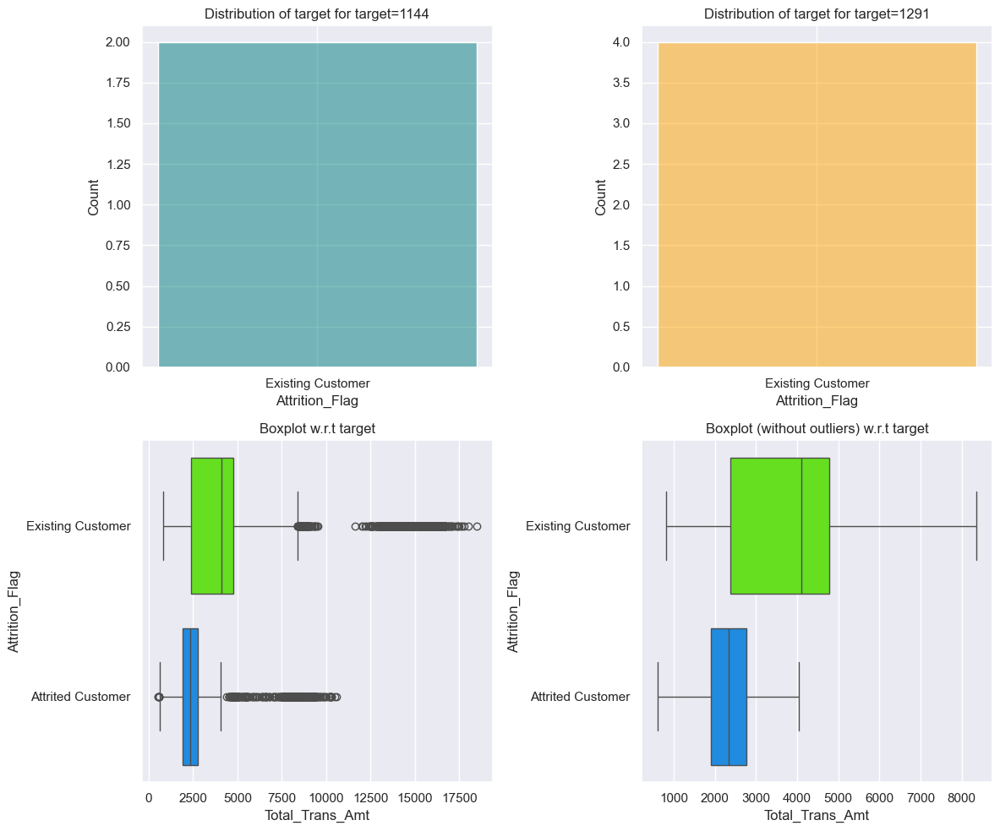

In [59]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Amt", data=df, orient="vertical")
distribution_plot_wrt_target(df, "Attrition_Flag", "Total_Trans_Amt")

* We observe high number of outliers in the boxplot for both existing customers and attritted customers.
* We observe that attrited customers generally have significantly lower transaction amounts compared to existing customers,
  based on the median. This indicates that customers with lower transaction amounts are more likely to attritted.

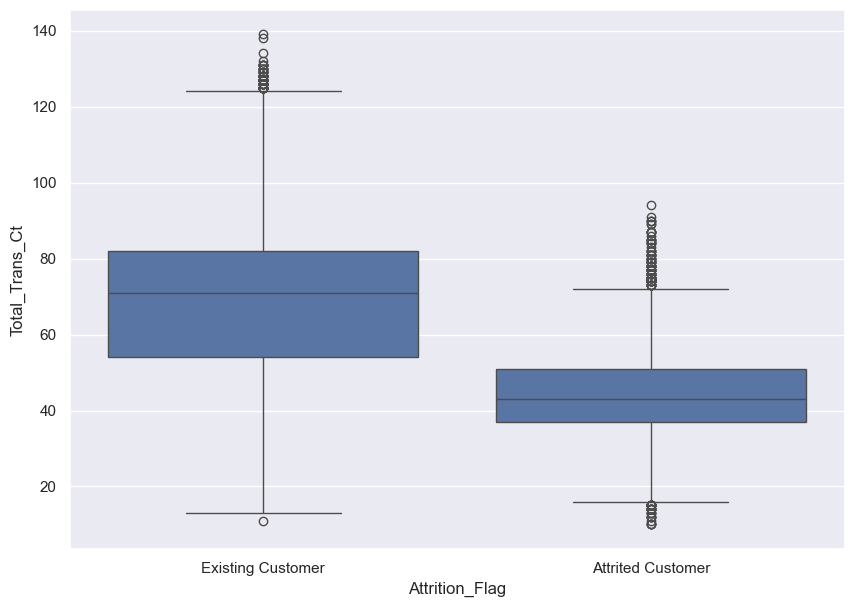

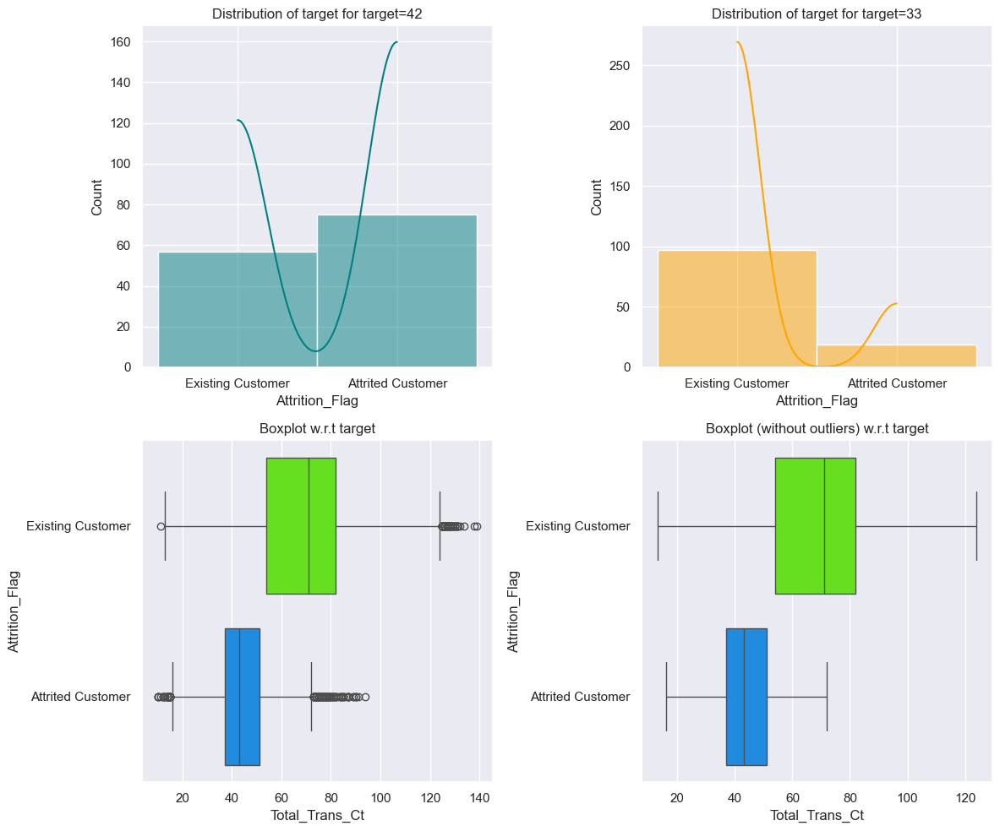

In [60]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Ct", data=df, orient="vertical")
distribution_plot_wrt_target(df, "Attrition_Flag", "Total_Trans_Ct")

* We observe noticeable number of outliers in the boxplot for both existing customers and attritted customers.
* We observe that attrited customers generally have significantly fewer transaction counts compared to existing customers, 
  based on the median. This suggests that attrited customers are likely to have fewer transaction counts.

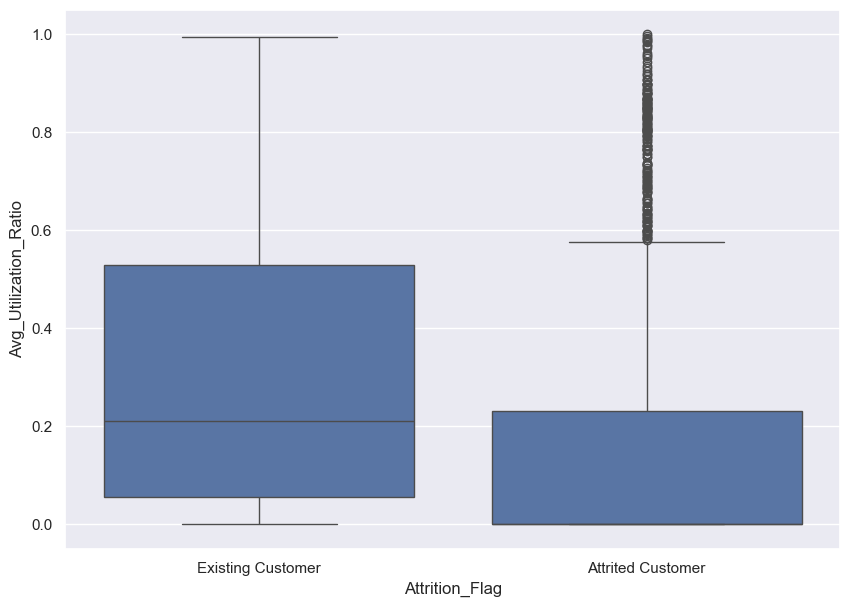

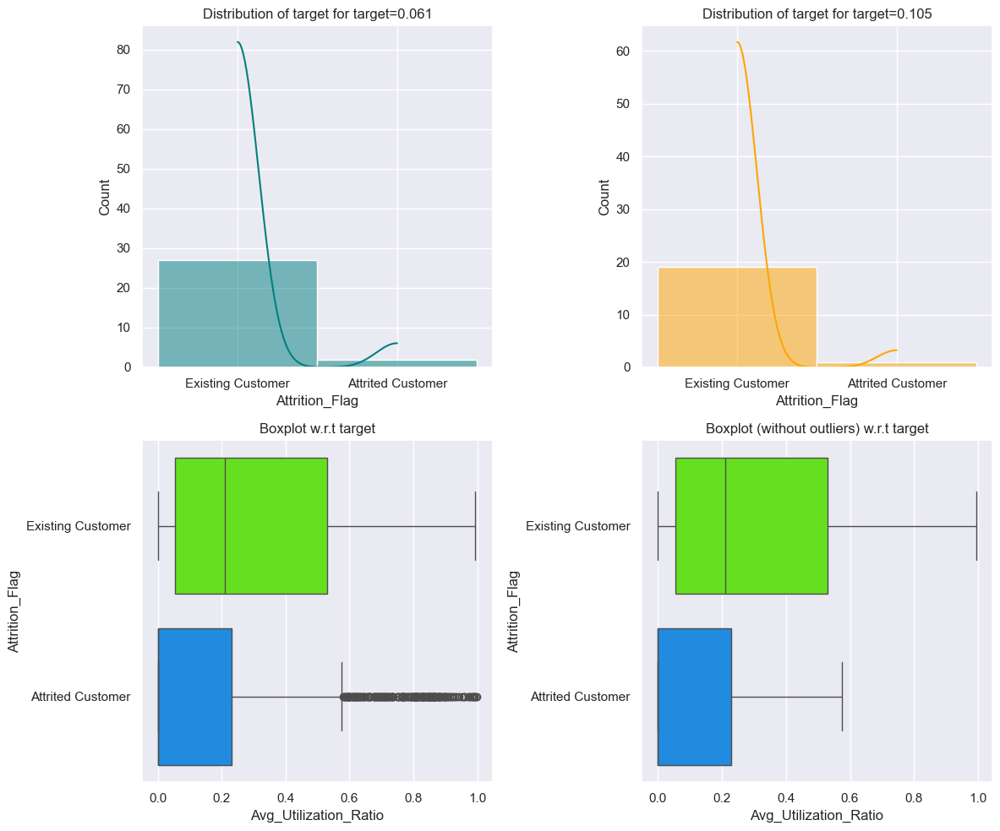

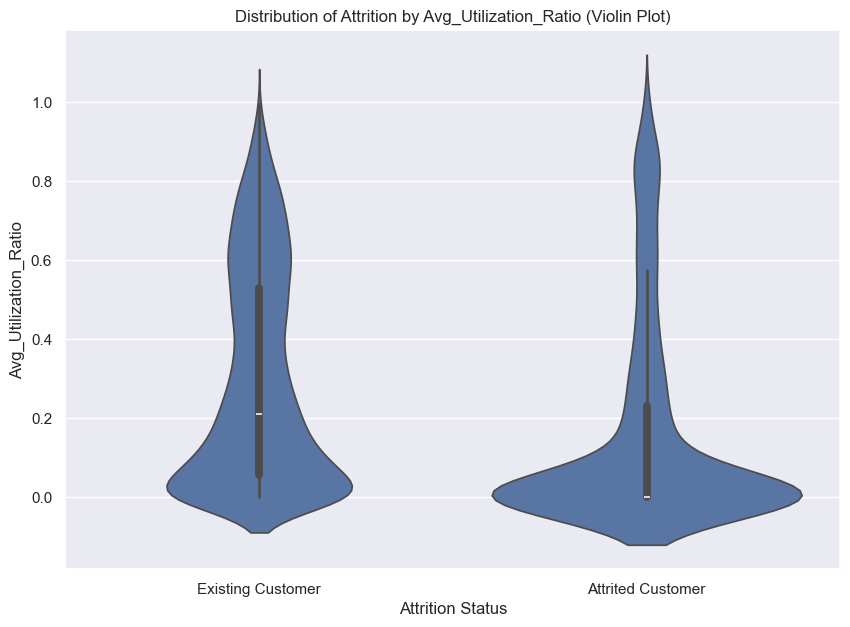

In [61]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Avg_Utilization_Ratio", data=df, orient="vertical")
distribution_plot_wrt_target(df, "Attrition_Flag", "Avg_Utilization_Ratio")

sns.violinplot(x="Attrition_Flag", y="Avg_Utilization_Ratio", data=df)
plt.title("Distribution of Attrition by Avg_Utilization_Ratio (Violin Plot)")
plt.xlabel("Attrition Status")
plt.ylabel("Avg_Utilization_Ratio")
plt.show()

* We observe high number of outliers in the boxplot for attritted customers.
* We can see that attrited customers show a lower average utilization ratio than existing customers based on the median. 
  This indicates that customers spending less of their available credit are likely to have attritted.

#### Changing the object datatype of Categorical Columns to type 'category'

In [62]:
cat_columns = ['Attrition_Flag','Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category','Dependent_count','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon']

df[cat_columns] = df[cat_columns].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  category
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  category
 4   Dependent_count           10127 non-null  category
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  category
 8   Card_Category             10127 non-null  category
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  category
 11  Months_Inactive_12_mon    10127 non-null  category
 12  Contacts_Count_12_mon     10127 non-null  category
 13  Credit_Limit              10127 non-null  floa

In [63]:
# Making a list of all categorical variables
cat_cols =  ['Attrition_Flag','Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category','Dependent_count','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon']

# Printing the count of unique categorical levels in each column
for column in cat_cols:
    print(data[column].value_counts())
    print("-" * 50)

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
--------------------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
--------------------------------------------------
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
--------------------------------------------------
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
--------------------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
--------------------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
--------------------------------------------------
3    2732
2    2655
1    1838


In [64]:
df.describe(include=['category']).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Dependent_count,10127,6,3,2732
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436
Total_Relationship_Count,10127,6,3,2305
Months_Inactive_12_mon,10127,7,3,3846
Contacts_Count_12_mon,10127,7,3,3380


In [65]:
def labeled_countplot(data, feature, perc=False, n=None):
    """
    Countplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 2))
    else:
        plt.figure(figsize=(n + 1, 2))

    plt.xticks(rotation=45, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
        
    )

    for p in ax.patches:
        if perc == True:
            #label = "{:.1f}%".format(100 * p.get_height() / total)  # percentage of each class of the category            
            label = '{:.1f}%\n({})'.format(100 * p.get_height()/len(data[feature]), p.get_height())  # percentage with value of each class of the category       
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=10,
            xytext=(0, 3),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

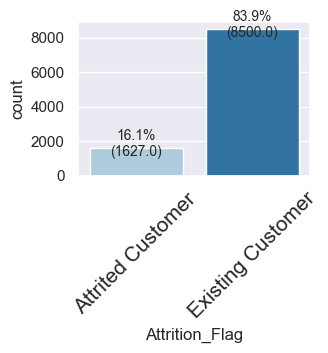

In [66]:
labeled_countplot(df,"Attrition_Flag", perc=True)

* Roughly 16% of credit card customers have attrited, highlighting a substantial proportion of customers who have discontinued
  their credit card services.

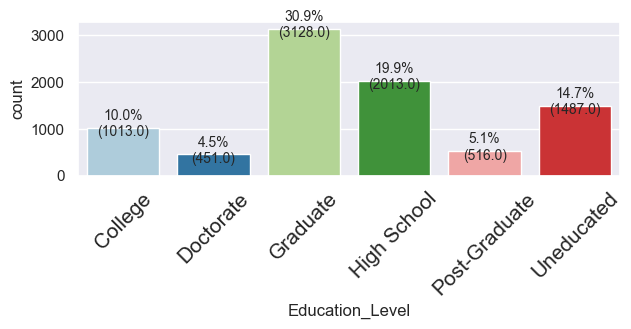

In [67]:
labeled_countplot(df,"Education_Level", perc=True)

* Approximately 53% of credit card customers are female, underscoring the predominant gender among credit card holders.

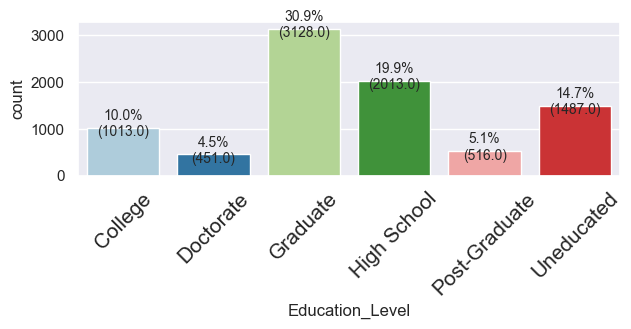

In [68]:
labeled_countplot(df,"Education_Level", perc=True)

* Roughly 30% of customers are graduates, with a relatively low representation of other higher education like post-graduates and
  doctorate holders (10%) , ~45% of the customers are lower education category. 

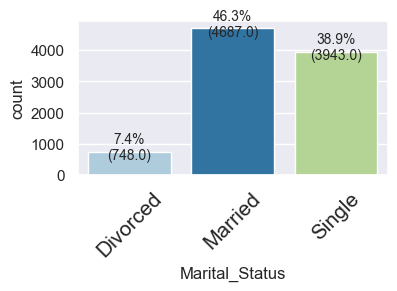

In [69]:
labeled_countplot(df,"Marital_Status", perc=True)

* Approximately 46.3% of credit card customers are married and 38.9% are single. There is a 7.4% unknown marital status that
  necessitates imputation or further investigation.

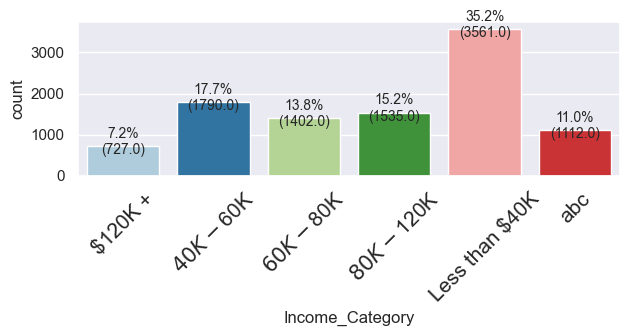

In [70]:
labeled_countplot(df,"Income_Category", perc=True)

* Approximately 35.2% of the customers earn less than 40k, this shows that majority of customers belong to low income group.
  Second majority also indicates to 40k-60k (17.7%) , that clearly explains that 52.4% of total credit card customers earn 
  less than 60K.
* 11% of the customers belongs to abc group, which has to be learned more.

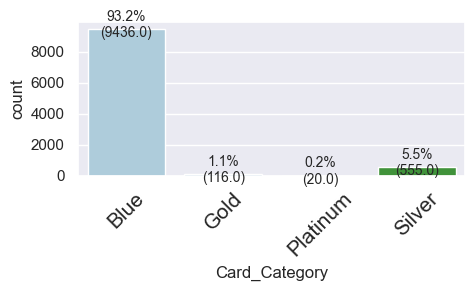

In [71]:
labeled_countplot(df,"Card_Category", perc=True)

* Approximately 93% of customers possess a blue card (may be due to the low income group majority resulting to low credit 
  limits), indicating that most hold a standard card type, while a smaller percentage have platinum cards, that means only 
  a minority of customers enjoying premium benefits.

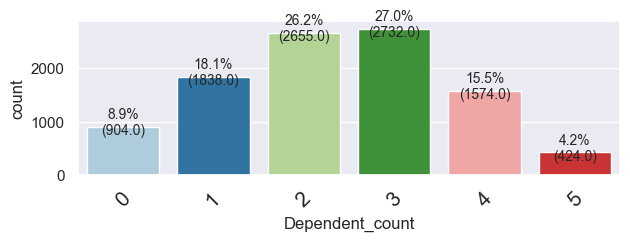

In [72]:
labeled_countplot(df,"Dependent_count", perc=True)

* Majority of the customers have 2-3 dependents ( approximately equal distribution 26.2% and 27%), sharing the 53.2% of 
  total customers. 
* Followed by 1 and 4 dependents having 18.1% and 15.5% respectively.

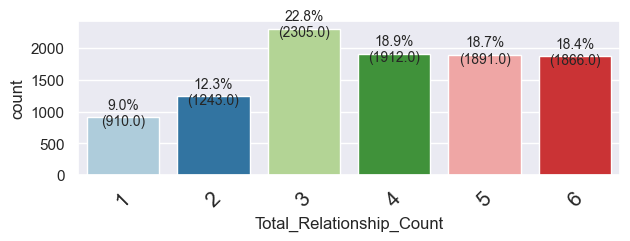

In [73]:
labeled_countplot(df,"Total_Relationship_Count", perc=True)

* Approximately 23% of customers have more than three products/ services, highlighting a segment of customers who utilize
  multiple banking services. Followed by customers using 4,5 & 6 products showing approximately 18% each.

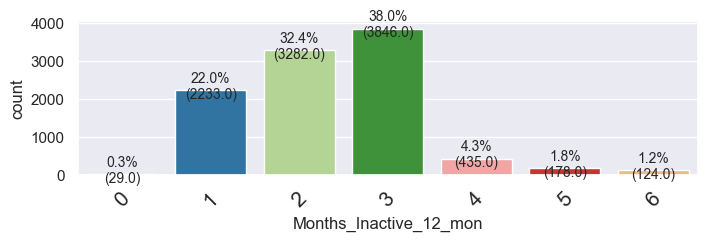

In [74]:
labeled_countplot(df,"Months_Inactive_12_mon", perc=True)

* Around 38% of customers have been inactive for three months. Further investigation into customers inactive for four, five, 
  or six months could reveal potential correlations with attrition.

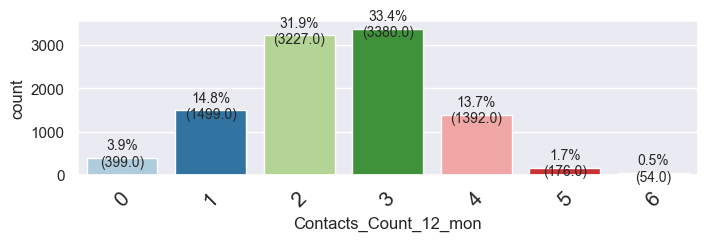

In [75]:
labeled_countplot(df,"Contacts_Count_12_mon", perc=True)

* Approximately 60% of customers were contacted 2-3 times within a 12-month period, suggesting a typical frequency of
  communication between the Bank and its customers.
* ~ 3.9% customers seems to be never communicated, and needs to be investigated further.

In [76]:
df['Age_group'] = pd.cut(df['Customer_Age'], bins = [25,35,45,55,65,75], labels = ['25-35', '36-45', '46-55', '56-65','66-75'])
df.Age_group.value_counts()

46-55    4135
36-45    3742
56-65    1321
25-35     919
66-75      10
Name: Age_group, dtype: int64

In [77]:
df.describe(include=['category']).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Dependent_count,10127,6,3,2732
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436
Total_Relationship_Count,10127,6,3,2305
Months_Inactive_12_mon,10127,7,3,3846
Contacts_Count_12_mon,10127,7,3,3380


Attrition_Flag     Attrited Customer  Existing Customer    All
Attrition_Flag                                                
Attrited Customer               1627                  0   1627
All                             1627               8500  10127
Existing Customer                  0               8500   8500
------------------------------------------------------------------------------------------------------------------------


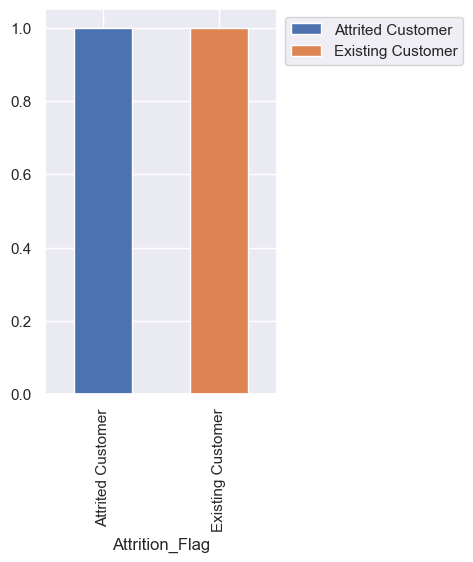

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


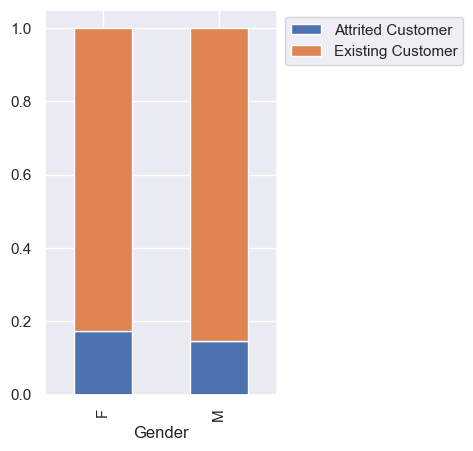

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


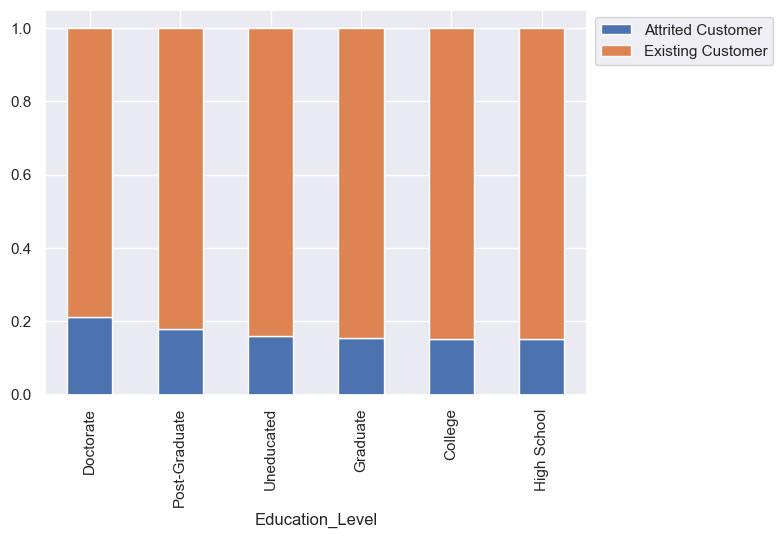

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


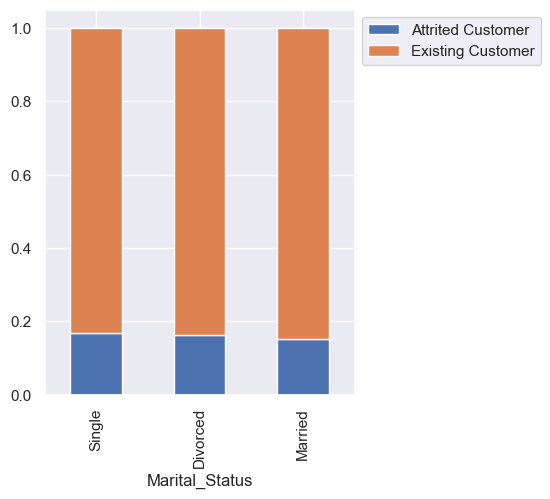

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


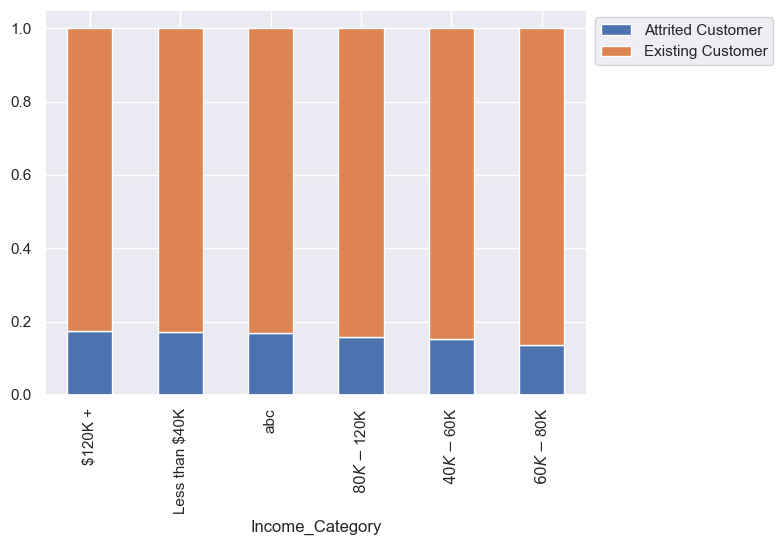

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


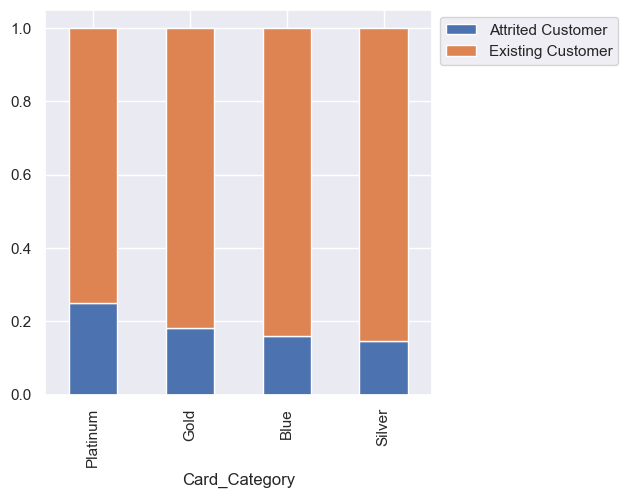

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


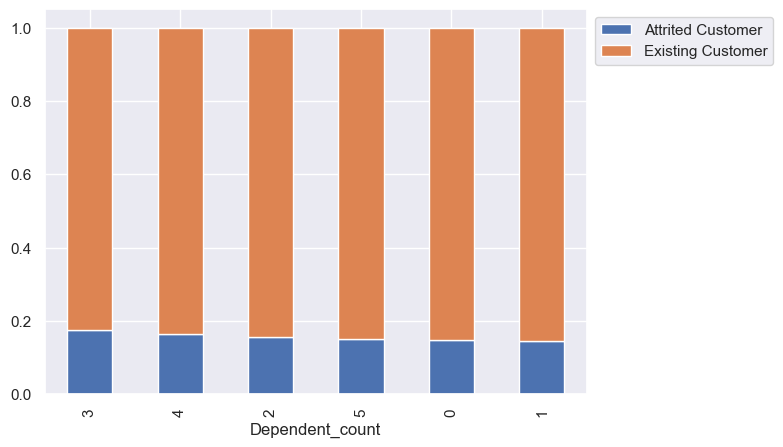

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


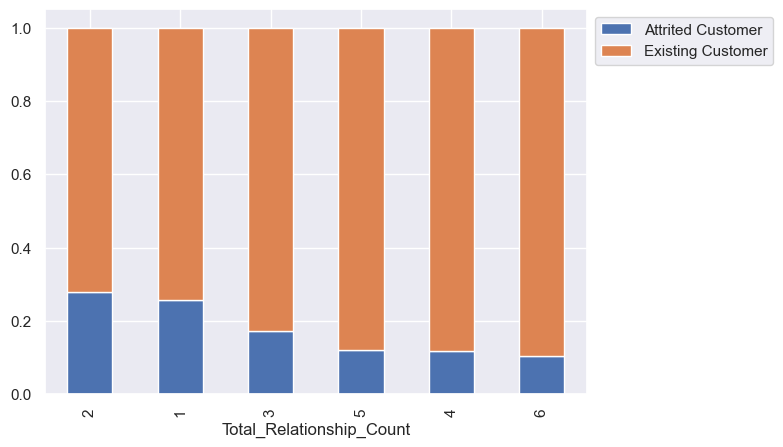

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


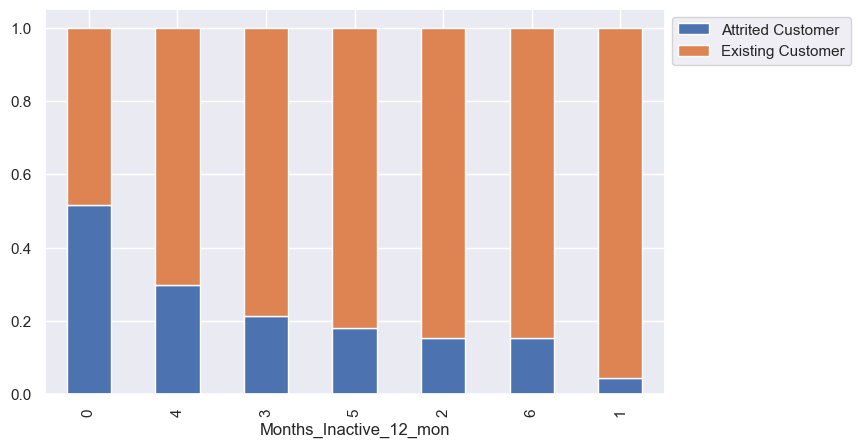

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


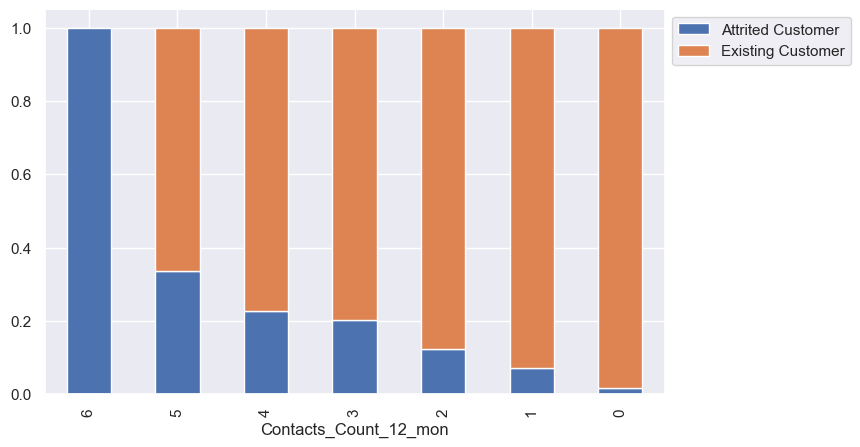

Attrition_Flag  Attrited Customer  Existing Customer    All
Age_group                                                  
All                          1627               8500  10127
46-55                         688               3447   4135
36-45                         606               3136   3742
56-65                         209               1112   1321
25-35                         122                797    919
66-75                           2                  8     10
------------------------------------------------------------------------------------------------------------------------


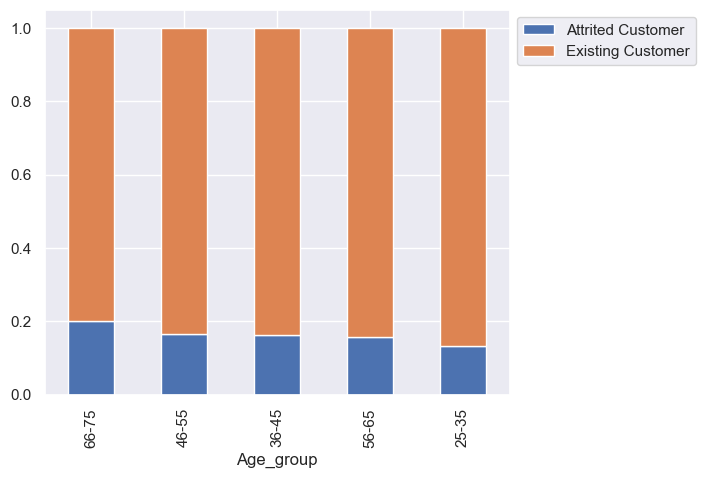

In [78]:
cat_cols.append("Age_group")
for variable in cat_cols:
    stacked_barplot(df, variable, "Attrition_Flag")

### Observations
##### Observations based on the categorical column relations with target 'Attrition_Flag'

* Out of 10127 customers 1627 are attritted and 8500 are existing customers.
* Female customers exhibit a higher attrition rate compared to male customers. Additionally, customers holding doctorate or
  postgraduate degrees demonstrate the highest attrition rates.
* Customers who are single have a higher attrition rate compared to those with other marital statuses.
* Customers with income levels at extreme ends, ie. below 40k and above 120k shows more likely to be with high attrition rate.
* Despite the limited sample size of 20, customers with platinum cards display a higher attrition rate. Additionally, customers
  with gold cards also exhibit a higher attrition rate compared to those with blue and silver cards. Analyzing the profiles of
  customers across different card types may reveal discernible patterns.
* Customers with three dependents have a higher attrition rate followed by 4 and then 2.
* Customers who possess only one or two bank products tend to have a higher attrition rate compared to those with more 
  bank products.
* Interestingly, customers who have never been inactive show the highest attrition rate. However, the sample size is small 
  (only 29 samples). Among inactive customers, those inactive for four months have the higher attrition rate, followed by 
  three months and five months.
* Customers who were contacted most frequently in the last 12 months have a higher attrition rate, prompting questions about
  whether the bank's proactive outreach or excessive contact may have influenced attrition.
* Customers in age group 66-75 exhibit the highest attrition rate, although this observation is drawn from a small sample 
  size of only 10 customers. Additionally, customers in age group 46-55 and 36-55 also show a higher attrition rate.

## Data Pre-Processing
##### Process steps involved

* Checking duplicate values.
* Checking missing values.
* Droping columns that might not add value to modeling.
* Imputing missing value as may be needed.
* And more as required for model building.

In [79]:
# let's check for duplicate values in the data
df.duplicated().sum()

0

* No duplicate values found.

### Checking for Missing Values

In [80]:
# let's check for missing values in the data
df = df.replace({'Unknown': None})
round(df.isnull().sum() / df.isnull().count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
Age_group                   0.000
dtype: float64

### Droping columns that might not add value to modeling.

In [81]:
df.drop(['CLIENTNUM'],axis=1,inplace=True)

In [82]:
df.drop(['Age_group'],axis=1,inplace=True)

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  category
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  category
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  category
 10  Months_Inactive_12_mon    10127 non-null  category
 11  Contacts_Count_12_mon     10127 non-null  category
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

In [84]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [85]:
df.tail()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


* We will use simple imputer to impute missing values

In [86]:
# Encoding categorical variables for simple imputing
attrition = {'Existing Customer':0, 'Attrited Customer':1}
df['Attrition_Flag']=df['Attrition_Flag'].map(attrition)

education = {'Uneducated':1,'High School':2, 'Graduate':3, 'College':4, 'Post-Graduate':5, 'Doctorate':6}
df['Education_Level']=df['Education_Level'].map(education)

marital_status = {'Married':1,'Single':2, 'Divorced':3}
df['Marital_Status']=df['Marital_Status'].map(marital_status)

income = {'Less than $40K':1,'$40K - $60K':2, '$60K - $80K':3, '$80K - $120K':4, '$120K +':5}
df['Income_Category']=df['Income_Category'].map(income)

### Missing-Value Treatment

In [87]:
# Keep backup of dataframe before splitting and duplicate a copy for model making
df_m = df.copy()

In [88]:
X = df_m.drop(["Attrition_Flag"], axis=1)
y = df_m["Attrition_Flag"]

* We will use mean to impute missing values in 'Income_Category','Education_Level','Marital_Status' columns.

In [89]:
# Create an instance of SimpleImputer with the mean strategy
imputer = SimpleImputer(strategy='mean')

# Fit and transform the imputer on the target variable
y = imputer.fit_transform(df[['Attrition_Flag']])

In [90]:
# Imputing the missing values
imp_mode = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
cols_to_impute = ['Income_Category','Education_Level','Marital_Status']
# fit and transform the imputer on train data
X[cols_to_impute] = imp_mode.fit_transform(X[cols_to_impute])

#### Splitting the dataset into dependent and independent sets

In [91]:
# Splitting data into training, validation and test sets:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


## Missing-Value Imputation

In [92]:
# Creating dummy variables for categorical variables
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_val = pd.get_dummies(data=X_val, drop_first=True)
X_test = pd.get_dummies(data=X_test, drop_first=True)

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [93]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(name, model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score
    #update_model_comparison(name, acc, recall, precision, f1)
    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )
    print(name)
    print(df_perf)
    return df_perf

In [120]:
def make_confusion_matrix(y_actual,y_predict,title):

  cm = confusion_matrix(y_actual, y_predict)

  # Define class labels
  class_labels = ['Class 0', 'Class 1']

  # Create a heatmap using seaborn
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=class_labels, yticklabels=class_labels)

  # Add labels, title, and axis ticks
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.title(title)
  plt.xticks(ticks=[0.5, 1.5], labels=class_labels)
  plt.yticks(ticks=[0.5, 1.5], labels=class_labels)

  # Show the plot
  plt.show()

#### Function to store the scores for comparison

In [94]:
import pandas as pd
model_comparison_table = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1']);
def update_model_comparison(model_name, accuracy, recall, precision, f1, df=None):
    # Create a new DataFrame if one is not provided
    if df is None:
        df = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1'])

    # Append the new model's performance metrics to the DataFrame
    new_row = {'Model': model_name, 'Accuracy': accuracy, 'Recall': recall, 'Precision': precision, 'F1': f1}
    df = df.append(new_row, ignore_index=True)
    #print(df)

### Model Building with original data

In [96]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("Decision Tree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
cv_results = [] # Empty list to store all model's CV scores for CrossTabulation
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    cv_results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))
    
print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 78.17268445839873
Random forest: 73.97278911564626
GBM: 80.73469387755102
Adaboost: 80.01622187336473
Xgboost: 85.55102040816325
Decision Tree: 78.17268445839873

Validation Performance:

Bagging: 0.7944785276073619
Random forest: 0.7484662576687117
GBM: 0.8251533742331288
Adaboost: 0.8220858895705522
Xgboost: 0.8987730061349694
Decision Tree: 0.7944785276073619


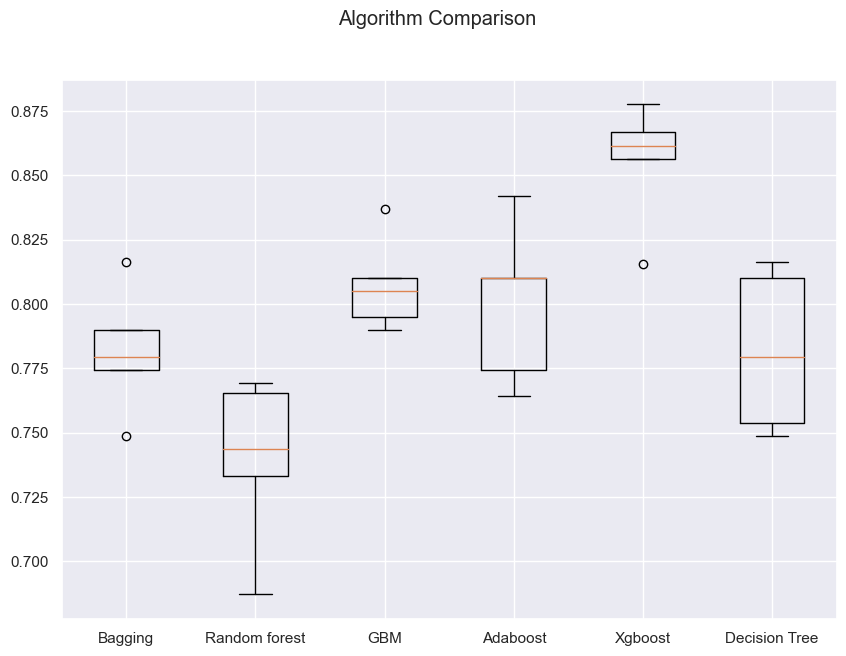

In [97]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

* We can see that the XGBoost is giving the highest cross-validated recall followed by Adaboost followed by GBM
* The boxplot shows that the performance of XGboost and Adaboost is consistent and their performance on the validation set is
  also good
* We will tune the best two models i.e. XGboost and Adaboost and see if the performance improves

### Model Building with Oversampled data


In [98]:
print(f"Before OverSampling, attrited customer: {sum(y_train==1)}")
print(f"Before OverSampling, existing customer: {sum(y_train==0)} \n")

Before OverSampling, attrited customer: [976]
Before OverSampling, existing customer: [5099] 



In [99]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [100]:
print(f"After OverSampling, attrited customer: {sum(y_train_over==1)}")
print(f"After OverSampling, existing customer: {sum(y_train_over==0)} \n")

After OverSampling, attrited customer: 5099
After OverSampling, existing customer: 5099 



In [101]:
print(f'After OverSampling, the shape of train_X: {X_train_over.shape}')
print(f'After OverSampling, the shape of train_y: {y_train_over.shape} \n')

After OverSampling, the shape of train_X: (10198, 39)
After OverSampling, the shape of train_y: (10198,) 



In [102]:
print("\n" "Training Performance Atfer OverSampling:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    model_performance_classification_sklearn(name, model, X_train, y_train)

print("\n" "Validation Performance After Oversampling:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    model_performance_classification_sklearn(name, model, X_val, y_val)


Training Performance Atfer OverSampling:

Bagging
   Accuracy  Recall  Precision    F1
0     0.998   0.993      0.995 0.994
Random forest
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000
GBM
   Accuracy  Recall  Precision    F1
0     0.971   0.916      0.904 0.910
Adaboost
   Accuracy  Recall  Precision    F1
0     0.949   0.856      0.831 0.843
Xgboost
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000
Decision Tree
   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000

Validation Performance After Oversampling:

Bagging
   Accuracy  Recall  Precision    F1
0     0.944   0.837      0.817 0.827
Random forest
   Accuracy  Recall  Precision    F1
0     0.952   0.825      0.868 0.846
GBM
   Accuracy  Recall  Precision    F1
0     0.962   0.902      0.865 0.883
Adaboost
   Accuracy  Recall  Precision    F1
0     0.950   0.874      0.824 0.848
Xgboost
   Accuracy  Recall  Precision    F1
0     0.970   0.893      0.918 0.90

* In training, Bagging, Decision Tree, and Random Forest achieved flawless accuracy, recall, precision, and F1 scores of 1.000,
  demonstrating their ability to precisely detect instances of customer attrition. AdaBoost achieved slightly lower metrics with
  an accuracy of 0.949, recall of 0.856, precision of 0.831, and F1 score of 0.843. Gradient Boosting performed well with an 
  accuracy of 0.971, recall of 0.916, precision of 0.904, and F1 score of 0.910. XGBoost matched the perfect scores of 1.000 
  across all evaluated metrics.
  
* The validation results demonstrate consistent strong performance across the models. 
  Bagging achieved an accuracy of 0.944, recall of 0.837, precision of 0.817, and F1 score of 0.827. 
  Decision Tree showed an accuracy of 0.924, recall of 0.782, precision of 0.757, and F1 score of 0.769. 
  Random Forest attained an accuracy of 0.952, recall of 0.825, precision of 0.868,and F1 score of 0.846. 
  AdaBoost maintained an accuracy of 0.950, recall of 0.874, precision of 0.824, and F1 score of 0.848. 
  Gradient Boosting achieved an accuracy of 0.962, recall of 0.902, precision of 0.865, and F1 score of 0.883. 
  XGBoost performed the best with an accuracy of 0.970, recall of 0.893, precision of 0.918, and F1 score of 0.905.
  
* After oversampling the data, these results indicate that the models consistently maintained their strong performance in
  accurately identifying positive cases of customer attrition.

### Model Building with Undersampled data

In [103]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [104]:
#Undersample to balance classes
print("Before Under Sampling, attrited customer: {}".format(sum(y_train==1)))
print("Before Under Sampling, existing customer: {} \n".format(sum(y_train==0)))

Before Under Sampling, attrited customer: [976]
Before Under Sampling, existing customer: [5099] 



In [105]:
rus = RandomUnderSampler(random_state = 1) # Undersample dependent variable
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

In [106]:
print("After Under Sampling, attrited customer: {}".format(sum(y_train_under==1)))
print("After Under Sampling, existing customer: {} \n".format(sum(y_train_under==0)))

After Under Sampling, attrited customer: 976
After Under Sampling, existing customer: 976 



In [107]:
print('After Under Sampling, the shape of train_X: {}'.format(X_train_under.shape))
print('After Under Sampling, the shape of train_y: {} \n'.format(y_train_under.shape))

After Under Sampling, the shape of train_X: (1952, 39)
After Under Sampling, the shape of train_y: (1952,) 



In [108]:
print("\n" "Training Performance Atfer UnderSampling:" "\n")
for name, model in models:
    model.fit(X_train_under, y_train_under)
    model_performance_classification_sklearn(name, model, X_train, y_train)

print("\n" "Validation Performance After Undersampling:" "\n")
for name, model in models:
    model.fit(X_train_under, y_train_under)
    model_performance_classification_sklearn(name, model, X_val, y_val)


Training Performance Atfer UnderSampling:

Bagging
   Accuracy  Recall  Precision    F1
0     0.942   0.990      0.739 0.846
Random forest
   Accuracy  Recall  Precision    F1
0     0.942   1.000      0.735 0.847
GBM
   Accuracy  Recall  Precision    F1
0     0.939   0.976      0.734 0.838
Adaboost
   Accuracy  Recall  Precision    F1
0     0.929   0.950      0.708 0.811
Xgboost
   Accuracy  Recall  Precision    F1
0     0.958   1.000      0.791 0.883
Decision Tree
   Accuracy  Recall  Precision    F1
0     0.916   1.000      0.656 0.793

Validation Performance After Undersampling:

Bagging
   Accuracy  Recall  Precision    F1
0     0.919   0.908      0.687 0.782
Random forest
   Accuracy  Recall  Precision    F1
0     0.929   0.933      0.714 0.809
GBM
   Accuracy  Recall  Precision    F1
0     0.933   0.948      0.724 0.821
Adaboost
   Accuracy  Recall  Precision    F1
0     0.923   0.948      0.691 0.799
Xgboost
   Accuracy  Recall  Precision    F1
0     0.938   0.957      0.736 0.

##### The training performance metrics for each model:

Bagging: Accuracy 0.942, Recall 0.990, Precision 0.739, F1 Score 0.846
Decision Tree: Accuracy 0.916, Recall 1.000, Precision 0.656, F1 Score 0.793
Random Forest: Accuracy 0.942, Recall 1.000, Precision 0.735, F1 Score 0.847
AdaBoost: Accuracy 0.929, Recall 0.950, Precision 0.708, F1 Score 0.811
Gradient Boosting: Accuracy 0.939, Recall 0.976, Precision 0.734, F1 Score 0.838
XGBoost: Accuracy 0.958, Recall 1.000, Precision 0.791, F1 Score 0.883

* These metrics indicate how well each model performed on the training data in terms of accuracy, recall, precision, and F1 score.

##### The validation set performance metrics for each model:

Bagging: Accuracy 0.919, Recall 0.908, Precision 0.687, F1 Score 0.782
Decision Tree: Accuracy 0.882, Recall 0.887, Precision 0.587, F1 Score 0.707
Random Forest: Accuracy 0.929, Recall 0.933, Precision 0.714, F1 Score 0.809
AdaBoost: Accuracy 0.923, Recall 0.948, Precision 0.691, F1 Score 0.799
Gradient Boosting: Accuracy 0.933, Recall 0.948, Precision 0.724, F1 Score 0.821
XGBoost: Accuracy 0.938, Recall 0.957, Precision 0.736, F1 Score 0.832

* These metrics reflect how well each model performed on the validation set in terms of accuracy, recall, precision, and F1
  score, demonstrating their robustness in identifying positive cases of customer attrition after training.
  
* Overall, implementing undersampling affected the models' performance, resulting in relatively high accuracy and recall 
  scores but a decrease in precision and F1 scores compared to previous results.

### HyperparameterTuning

With the above recall performance of our models, we can identify the top three models with the highest recall scores in the validation set for further hyperparameter tuning to potentially improve their performance.

* Gradient Boosting
* AdaBoost
* Xgboost

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

### Hyperpameter tuning AdaBoost original data

In [109]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Create the AdaBoost classifier
adaboost = AdaBoostClassifier(random_state=1)

# Perform hyperparameter tuning using RandomizedSearchCV
clf = RandomizedSearchCV(estimator=adaboost, param_distributions=param_grid, cv=5, random_state=1, n_iter=10)
clf.fit(X_train, y_train)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(clf.best_params_)

print("\n" "Training Performance AdaBoost Atfer Hypeparameter tuning original data:" "\n")
model_performance_classification_sklearn("", clf, X_train, y_train)

print("\n" "Validation Performance AdaBoost After Hyperparamater tuning original data:" "\n")
model_performance_classification_sklearn("", clf, X_val, y_val)

Best Hyperparameters:
{'n_estimators': 100, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)}

Training Performance AdaBoost Atfer Hypeparameter tuning original data:


   Accuracy  Recall  Precision    F1
0     0.980   0.916      0.959 0.937

Validation Performance AdaBoost After Hyperparamater tuning original data:


   Accuracy  Recall  Precision    F1
0     0.965   0.847      0.932 0.887


,Accuracy,Recall,Precision,F1
0,0.965,0.847,0.932,0.887


#### Hyperpameter tuning GradientBoostingClassifier original data

In [110]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Initialize the GradientBoost model
gb = GradientBoostingClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=gb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train, y_train)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning original data:" "\n")
model_performance_classification_sklearn("", best_model, X_train, y_train)

print("\n" "Validation Performance GradientBoostingClassifier After Hyperparamater tuning original data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)

Best Hyperparameters:
{'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)}

Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning original data:


   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000

Validation Performance GradientBoostingClassifier After Hyperparamater tuning original data:


   Accuracy  Recall  Precision    F1
0     0.936   0.794      0.804 0.799


,Accuracy,Recall,Precision,F1
0,0.936,0.794,0.804,0.799


##### Hyperpameter tuning XBoost original data

In [111]:
# Define the parameter grid for hyperparameter tuning
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

# Initialize the XGBoost model
xgb = XGBClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train, y_train)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance XBoost Atfer Hypeparameter tuning original data:" "\n")
model_performance_classification_sklearn("", best_model, X_train, y_train)

print("\n" "Validation Performance XBoost After Hyperparamater tuning original data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)

Best Hyperparameters:
{'subsample': 0.7, 'scale_pos_weight': 1, 'n_estimators': 100, 'learning_rate': 0.05, 'gamma': 1}

Training Performance XBoost Atfer Hypeparameter tuning original data:


   Accuracy  Recall  Precision    F1
0     0.983   0.928      0.965 0.946

Validation Performance XBoost After Hyperparamater tuning original data:


   Accuracy  Recall  Precision    F1
0     0.967   0.862      0.930 0.895


,Accuracy,Recall,Precision,F1
0,0.967,0.862,0.930,0.895


* The XGBoost model, after tuning with original data using Randomized Search, attained an impressive recall rate of 0.86.

### Hyperpameter tuning AdaBoost oversampled data

In [112]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Create the AdaBoost classifier
adaboost = AdaBoostClassifier(random_state=1)

# Perform hyperparameter tuning using RandomizedSearchCV
clf = RandomizedSearchCV(estimator=adaboost, param_distributions=param_grid, cv=5, random_state=1, n_iter=10)
clf.fit(X_train_over, y_train_over)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(clf.best_params_)

print("\n" "Training Performance AdaBoost Atfer Hypeparameter tuning oversampled data:" "\n")
model_performance_classification_sklearn("", clf, X_train_over, y_train_over)

print("\n" "Validation Performance AdaBoost After Hyperparamater tuning oversampled data:" "\n")
model_performance_classification_sklearn("", clf, X_val, y_val)

Best Hyperparameters:
{'n_estimators': 50, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)}

Training Performance AdaBoost Atfer Hypeparameter tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     0.963   0.972      0.954 0.963

Validation Performance AdaBoost After Hyperparamater tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     0.938   0.868      0.775 0.819


,Accuracy,Recall,Precision,F1
0,0.938,0.868,0.775,0.819


#### Hyperpameter tuning GradientBoostingClassifier oversampled data

In [113]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Initialize the GradientBoost model
gb = GradientBoostingClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=gb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train_over, y_train_over)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning oversampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_train_over, y_train_over)

print("\n" "Validation Performance GradientBoostingClassifier After Hyperparamater tuning oversampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)


Best Hyperparameters:
{'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)}

Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000

Validation Performance GradientBoostingClassifier After Hyperparamater tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     0.924   0.782      0.757 0.769


,Accuracy,Recall,Precision,F1
0,0.924,0.782,0.757,0.769


#### Hyperpameter tuning XBoost oversampled data

In [114]:
# Define the parameter grid for hyperparameter tuning
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

# Initialize the XGBoost model
xgb = XGBClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train_over, y_train_over)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance XBoost Atfer Hypeparameter tuning oversampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_train_over, y_train_over)

print("\n" "Validation Performance XBoost After Hyperparamater tuning oversampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)

Best Hyperparameters:
{'subsample': 0.7, 'scale_pos_weight': 1, 'n_estimators': 50, 'learning_rate': 0.05, 'gamma': 3}

Training Performance XBoost Atfer Hypeparameter tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     0.979   0.982      0.976 0.979

Validation Performance XBoost After Hyperparamater tuning oversampled data:


   Accuracy  Recall  Precision    F1
0     0.950   0.902      0.810 0.853


,Accuracy,Recall,Precision,F1
0,0.950,0.902,0.810,0.853


* The XGBoost model, optimized through Randomized Search on oversampled data, achieved a peak recall score of 0.90.

#### Hyperpameter tuning AdaBoost undersampled data

In [115]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Create the AdaBoost classifier
adaboost = AdaBoostClassifier(random_state=1)

# Perform hyperparameter tuning using RandomizedSearchCV
clf = RandomizedSearchCV(estimator=adaboost, param_distributions=param_grid, cv=5, random_state=1, n_iter=10)
clf.fit(X_train_under, y_train_under)

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(clf.best_params_)

print("\n" "Training Performance AdaBoost Atfer Hypeparameter tuning undersampled data:" "\n")
model_performance_classification_sklearn("", clf, X_train_under, y_train_under)

print("\n" "Validation Performance AdaBoost After Hyperparamater tuning undersampled data:" "\n")
model_performance_classification_sklearn("", clf, X_val, y_val)

Best Hyperparameters:
{'n_estimators': 100, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1)}

Training Performance AdaBoost Atfer Hypeparameter tuning undersampled data:


   Accuracy  Recall  Precision    F1
0     0.988   0.995      0.981 0.988

Validation Performance AdaBoost After Hyperparamater tuning undersampled data:


   Accuracy  Recall  Precision    F1
0     0.936   0.957      0.731 0.829


,Accuracy,Recall,Precision,F1
0,0.936,0.957,0.731,0.829


#### Hyperpameter tuning GradientBoostingClassifier undersampled data

In [116]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

# Initialize the GradientBoost model
gb = GradientBoostingClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=gb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train_under, y_train_under)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning undersampled dataa:" "\n")
model_performance_classification_sklearn("", best_model, X_train_under, y_train_under)

print("\n" "Validation Performance GradientBoostingClassifier After Hyperparamater tuning undersampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)


Best Hyperparameters:
{'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)}

Training Performance GradientBoostingClassifier Atfer Hypeparameter tuning undersampled dataa:


   Accuracy  Recall  Precision    F1
0     1.000   1.000      1.000 1.000

Validation Performance GradientBoostingClassifier After Hyperparamater tuning undersampled data:


   Accuracy  Recall  Precision    F1
0     0.882   0.887      0.587 0.707


,Accuracy,Recall,Precision,F1
0,0.882,0.887,0.587,0.707


#### Hyperpameter tuning XBoost undersampled data

In [117]:
# Define the parameter grid for hyperparameter tuning
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

# Initialize the XGBoost model
xgb = XGBClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train_under, y_train_under)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Training Performance XBoost Atfer Hypeparameter tuning undersampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_train_under, y_train_under)

print("\n" "Validation Performance XBoost After Hyperparamater tuning undersampled data:" "\n")
model_performance_classification_sklearn("", best_model, X_val, y_val)

Best Hyperparameters:
{'subsample': 0.7, 'scale_pos_weight': 1, 'n_estimators': 100, 'learning_rate': 0.05, 'gamma': 1}

Training Performance XBoost Atfer Hypeparameter tuning undersampled data:


   Accuracy  Recall  Precision    F1
0     0.986   0.994      0.979 0.986

Validation Performance XBoost After Hyperparamater tuning undersampled data:


   Accuracy  Recall  Precision    F1
0     0.935   0.960      0.725 0.826


,Accuracy,Recall,Precision,F1
0,0.935,0.960,0.725,0.826


* The XGBoost model, optimized with Randomized Search using undersampled data, achieved its highest recall score of 0.96 on 
  the validation dataset.

#### Sample tuning method for Decision tree with undersampled data

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

## Model Comparison and Final Model Selection

In [118]:
comparison_frame = pd.DataFrame({'Model':['Bagging original',
'Decision Tree original',
'Random Forest original',
'AdaBoost original',
'Gradient Boosting original',
'XBoost original',
'Bagging OverSampling',
'Decision Tree OverSampling',
'Random Forest OverSampling',
'AdaBoost OverSampling',
'Gradient Boosting OverSampling',
'XBoost OverSampling',
'Bagging UnderSampling',
'Decision Tree UnderSampling',
'Random Forest UnderSampling',									
'AdaBoost UnderSampling',									
'Gradient Boosting UnderSampling',
'XBoost UnderSampling',					 
'AdaBoost hp tunning original data',
'GradientBoost hp tunning original data',
'XBoost hp tunning original data',
'AdaBoost hp tunning oversampled data',
'GradientBoost hp tunning oversampled data',
'XBoost hp tunning oversampled data',
'AdaBoost hp tunning undersampled data',
'GradientBoost hp tunning undersampled data',
'XBoost hp tunning undersampled data'],
'train recall':[0.98,1.0,1.0,0.84,0.87,1.0,0.99,1.0,1.0,0.85,0.91,1.0,0.99,1.0,1.0,0.95,0.97,1.0,  0.92,1.0,0.93,0.97,1.0,0.98,0.99,1.0,0.99],
'validation  recall':[0.79,0.79,0.74,0.82,0.82,0.89,0.83,0.78,0.82,0.87,0.90,0.89,0.90,0.88,0.93,0.94,0.94,0.95,  0.85,0.79,0.86,0.87,0.78,0.90,0.95,0.87,0.96]})

comparison_frame

,Model,train recall,validation recall
0,Bagging original,0.980,0.790
1,Decision Tree original,1.000,0.790
2,Random Forest original,1.000,0.740
3,AdaBoost original,0.840,0.820
4,Gradient Boosting original,0.870,0.820
5,XBoost original,1.000,0.890
6,Bagging OverSampling,0.990,0.830
7,Decision Tree OverSampling,1.000,0.780
8,Random Forest OverSampling,1.000,0.820
9,AdaBoost OverSampling,0.850,0.870


* The XGBoost model, tuned with undersampled data using Randomized Search, achieved a validation recall of 0.96 and a 
  training recall of 0.99, demonstrating strong performance on both datasets.
* The second best model, AdaBoost, tuned with undersampled data using Randomized Search, achieved a validation recall of 
  0.95 and a training recall of 0.99.
* The third best model, XGBoost, tuned with oversampled data using Randomized Search, achieved a validation recall of 0.90 and 
  a training recall of 0.98.

### Test set final performance

### Finaly we will test our best model XGBoost with undersampled data on testing dataset

Best Hyperparameters:
{'subsample': 0.7, 'scale_pos_weight': 1, 'n_estimators': 100, 'learning_rate': 0.05, 'gamma': 1}

Testing Performance XBoost Atfer Hypeparameter tuning undersampled data:

XBoost: 0.9753846153846154
Decision Tree
   Accuracy  Recall  Precision    F1
0     0.869   0.886      0.558 0.685


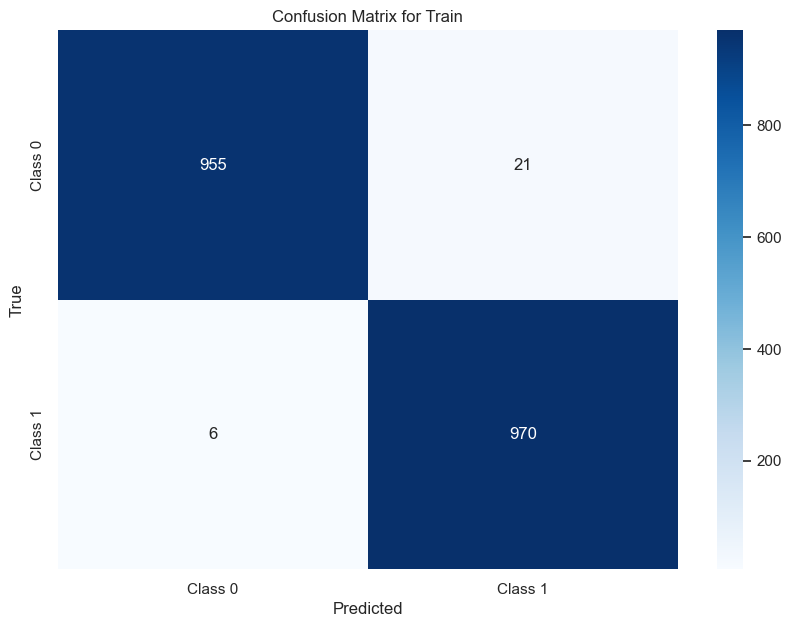

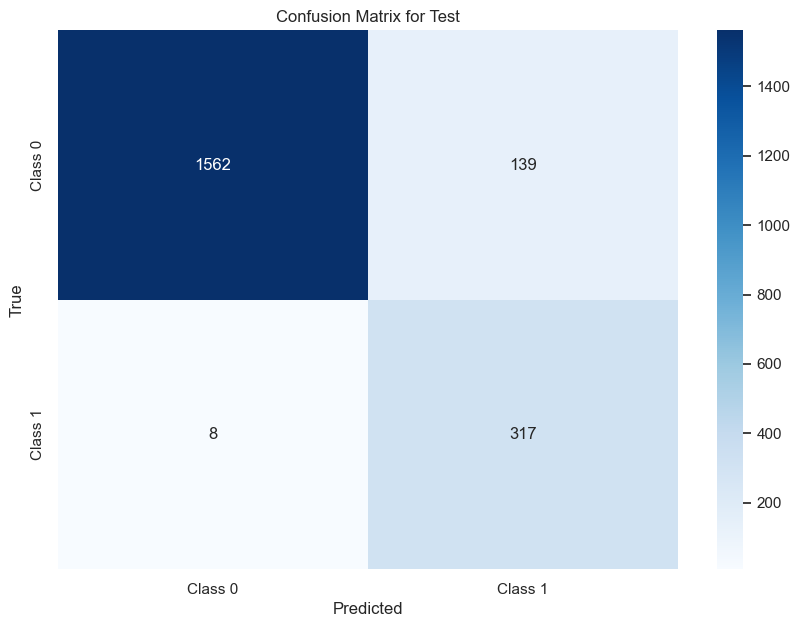

In [121]:
# Hyperpameter tuning XGBoost undersampled data

# Define the parameter grid for hyperparameter tuning
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

# Initialize the XGBoost model
xgb = XGBClassifier(random_state=1)

# Perform randomized search with 10 iterations
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    cv=5,
    random_state=1,
    n_iter=10
)

# Fit the randomized search on your training data
random_search.fit(X_train_under, y_train_under)

# Get the best model and best hyperparameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_

# Print the best hyperparameters found during tuning
print("Best Hyperparameters:")
print(best_params)

print("\n" "Testing Performance XBoost Atfer Hypeparameter tuning undersampled data:" "\n")
scores = recall_score(y_test, best_model.predict(X_test))
print("{}: {}".format("XBoost", scores))
model_performance_classification_sklearn(name, model, X_test, y_test)

make_confusion_matrix(y_train_under,best_model.predict(X_train_under),"Confusion Matrix for Train")
make_confusion_matrix(y_test,best_model.predict(X_test),"Confusion Matrix for Test")

#### Get the feature importances from the best model

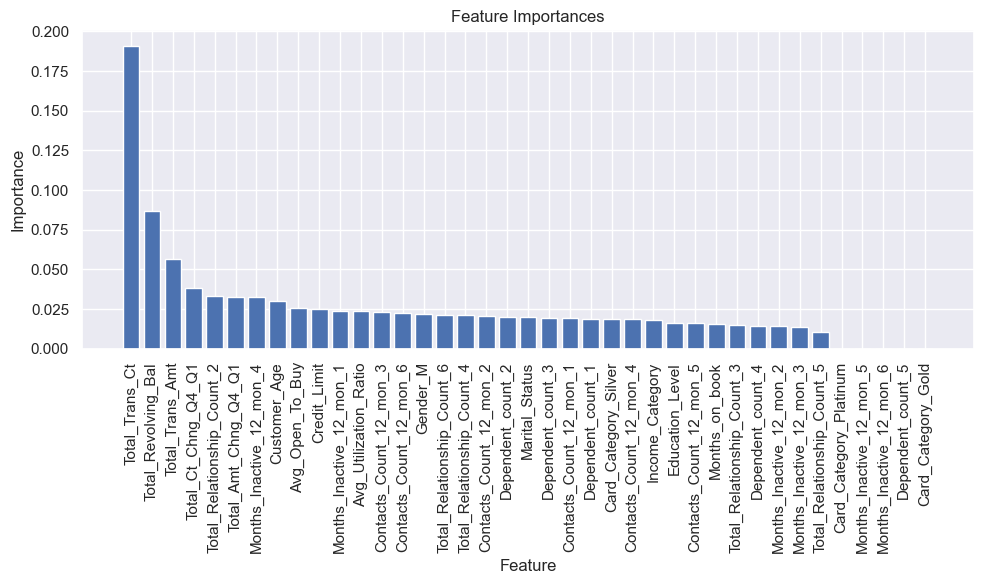

In [122]:
importances = best_model.feature_importances_

# Create a DataFrame to store the feature importances
importance_df = pd.DataFrame({'Feature': X_test.columns.tolist(), 'Importance': importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Create a bar plot of the feature importances
plt.figure(figsize=(10, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

* The XGBoost model, tuned with undersampled data using Randomized Search, achieved the highest recall performance on the 
  testing set, reaching 0.98.
* The confusion matrix also indicates fewer false negatives in both the training and test datasets.
* The feature importances reveal that Total_Trans_Ct, Total_Revolving_Bal, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1, and 
  Total_Relationship_Count are the top five important features.

# Business Insights and Conclusions

* Based on exploratory data analysis (EDA), it appears that customers who have multiple products with the bank are less likely
  to leave (attrite). To retain these customers, the bank should consider offering them additional products. This strategy 
  could increase customer engagement and encourage more purchases, thereby enhancing customer retention.

* Customers who have not engaged for a month are more likely to leave. The bank should concentrate on these customers and 
  take action to re-engage them.
  
* Customers who have a lower transaction count, less revolving balance, and smaller transaction amounts on a credit card are more likely to attrite. These indicators suggest that these customers are not actively using their credit cards. To retain them, the bank should explore options such as offering more rewards, cashback, or other incentives to encourage increased card usage.

* Customers who attrite often exhibit a lower average utilization ratio, indicating they are not utilizing their credit card to its full potential.

* Based on the EDA, customers aged 36-55, holding doctorate or postgraduate degrees, or identifying as female, exhibit higher attrition rates. This suggests that competitive banks may offer better deals, leading these customers to decrease their credit card usage with the current bank.

* Exploratory data analysis also shows that customers who have had more frequent interactions with the bank in the last 12 months are more likely to attrite. This underscores the importance of investigating whether there were any unresolved issues or concerns that may have caused customer dissatisfaction and, ultimately, their departure from the bank.


### Model Save

In [123]:
import sklearn
print(sklearn.__version__)

1.2.2


In [124]:
import xgboost

print(xgboost.__version__)

2.0.3


In [126]:
from joblib import dump

# Save the best model to a file
model_filename = 'credit_card_users_churn_prediction_xgb_model.joblib'
dump(best_model, model_filename)

print(f"Model saved as {model_filename}")

Model saved as credit_card_users_churn_prediction_xgb_model.joblib


In [128]:
import pickle

# Save the best model to a file
model_filename = 'credit_card_users_churn_prediction_xgb_model.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(best_model, file)

print(f"Model saved to {model_filename}")

from joblib import dump

Model saved to credit_card_users_churn_prediction_xgb_model.pkl


## Happy Banking !!!

***